In [1]:
import os
import re
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import pickle
from tqdm import tqdm as tqdm
import scipy
from scipy import signal
from IPython.display import display
from pathlib import Path

import dask
from dask import dataframe
from dask import delayed
from dask.distributed import Client, LocalCluster, TimeoutError

from utils import cross_correlation


%matplotlib inline

pd.options.display.max_rows = 15

%load_ext autoreload
%autoreload 2

In [2]:
DATAPATH = Path(r"Z:\Éduqués Stressés")
FREQ = 100

# Préparation des données

In [85]:
from dask.distributed import Client

client = Client()
client

Client Scheduler: tcp://35.234.245.130:8786 Dashboard: http://35.234.245.130:8787/status,Cluster Workers: 1 Cores: 2 Memory: 7.85 GB


In [88]:
local_client = Client()

C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\distributed\dashboard\core.py:72: UserWarning: 
Port 8787 is already in use. 
Perhaps you already have a cluster running?
Hosting the diagnostics dashboard on a random port instead.
  warnings.warn("\n" + msg)


In [90]:
def load_data(filepath):
    df = pd.read_excel(filepath, 
                       dtype={'Étudiant - PPG': np.float32, 'Directeur - Pulse': np.float32, 'Étudiant - Rate': np.float32,
                                   'Directeur - Rate': np.float32, 'Étudiant - EDA': np.float32, 'Directeur - EDA': np.float32},
                       na_values= '-',)
    df['dyade'] = int(re.search('dyade_(\d+)', filepath, flags=re.I).groups()[0])
    return df

In [ ]:
filepaths = [os.path.join(DATAPATH, _) for _ in os.listdir(DATAPATH) if 'xlsx' in _]

dfs = client.gather(client.map(load_data, filepaths))

In [6]:
df_all = pd.concat(dfs, sort=False)
df_all = df_all.drop(columns=['Sync', 'Sync2', 'NOT(LESS(CH16', 'Date_Time_Absolute_dmy_hmsf', 
                              'Date_dmy', 'Time_Absolute_hms', 'Time_Absolute_f', 'Time_Relative_hmsf',
                              'Time_Relative_hms', 'Time_Relative_f'
                             ]).copy()
#del dfs
df_all = df_all.rename(columns={'Time_Relative_sf':'time'})
df_all.Behavior = np.where(df_all.Behavior.isna(), df_all['Behavior.1'], df_all.Behavior)

In [7]:
df_all = df_all.reset_index()

## Clean behavior

In [8]:
def transfrom_to_string(x):
    if pd.isna(x):
        return ''
    else:
        return x.lower()

def keep_only_state_event(x):
    x = transfrom_to_string(x)
    cat = []
    if pd.isna(x):
        return ''
    if 'ambig' in x.lower():
        cat.append('ambigu')
    if 'collabora' in x.lower():
        cat.append('collaboration')
    if 'retrait' in x.lower():
        cat.append('retrait')    
    #if len(cat)<1:
    #    cat.append(x)
    return ','.join(cat)
    
def keep_only_point_event(x):
    x = transfrom_to_string(x)
    cat = []
    if 'soutien' in x.lower():
        cat.append('soutien')
    if 'critique' in x.lower():
        cat.append('critique')
    if 'ignore' in x.lower():
        cat.append('ignore') 
    #if len(cat)<1:
    #    cat.append(x)
    return ','.join(cat)


In [9]:
df_all['Behavior_clean'] = df_all.Behavior.apply(keep_only_state_event).astype('category')
df_all['Behavior_point_clean'] = (df_all.Behavior.apply(transfrom_to_string) 
                                  + df_all['Behavior.1'].apply(transfrom_to_string)
                                  + df_all['Behavior.2'].apply(transfrom_to_string)
                                 ).apply(keep_only_point_event).astype('category')

In [10]:
df_all['Bruit'] = df_all.Behavior.apply(transfrom_to_string).str.contains('bruit') | df_all['Behavior.1'].apply(transfrom_to_string).str.contains('bruit')

## Clean HR

On trouve les sections avec des données de rythme cardiaque invalides

In [11]:
df_all['Directeur - Rate Valid']  = (41 < df_all['Directeur - Rate']) & (df_all['Directeur - Rate'] < 180)
df_all['Étudiant - Rate Valid']  = (41 < df_all['Étudiant - Rate']) & (df_all['Étudiant - Rate'] < 180)

df_all['Directeur - Rate Valid']  = df_all['Directeur - Rate Valid'] & (df_all['Directeur - Rate'] < (df_all.loc[df_all['Directeur - Rate Valid'], 'Directeur - Rate'].mean() + 4*df_all.loc[df_all['Directeur - Rate Valid'], 'Directeur - Rate'].std()))
df_all['Étudiant - Rate Valid']  =  df_all['Étudiant - Rate Valid'] & (df_all['Étudiant - Rate'] < (df_all.loc[df_all['Étudiant - Rate Valid'], 'Étudiant - Rate'].mean() + 4*df_all.loc[df_all['Étudiant - Rate Valid'], 'Étudiant - Rate'].std()))

In [12]:
df_all['Directeur - Rate Valid'] = df_all['Directeur - Rate Valid'] & ~(df_all['Bruit'])
df_all['Étudiant - Rate Valid'] = df_all['Étudiant - Rate Valid'] & ~(df_all['Bruit'])

## Process and clean EDA

In [13]:
def extract_phasic(eda):
    eda = eda[:]
    eda[np.isnan(eda)] = 0
    fs = 100
    nyquist = fs/2
    lcof = 0.05
    hcof = 2
    
    wn = np.array([lcof, hcof])/nyquist
    
    b, a = scipy.signal.butter(4, wn, btype='bandpass')
    
    return scipy.signal.filtfilt(b, a, eda)

def extract_tonic(eda):
    phasic = extract_phasic(eda)
    return eda-phasic

On nettoie les données en annontant les mauvaises sections

In [14]:
def compute_valid_eda_mask(eda):
    mask = eda[:]
    mask[np.isnan(mask)] = -1
    mask = mask > 0
    
    phasic = extract_phasic(eda)
    
    # on enleve les sections où il y a un grand changement
    change = np.abs(np.ediff1d(phasic, to_begin=0))
    limit = np.sort(change)[:int(0.75*len(change))].std()*50
    
    mask = mask & ((np.convolve(change>limit, np.ones(2000), mode='same')) <= 1)    
    
    phasic = phasic[mask]
    
    # on enleve les signals qui ne bougent pas assez

    if (np.sum(np.abs(phasic))/len(phasic)) < 0.01:
        print('Le signal phasic ne bouge pas assez')
        mask = (mask * 0).astype(bool)
    
    return mask

df_all['Étudiant - EDA valid'] = True
df_all['Directeur - EDA valid'] = True

df_all['Étudiant - EDA phasic'] = extract_phasic(df_all['Étudiant - EDA'])
df_all['Directeur - EDA phasic'] = extract_phasic(df_all['Directeur - EDA'])

df_all['Étudiant - EDA tonic'] = extract_tonic(df_all['Étudiant - EDA'])
df_all['Directeur - EDA tonic'] = extract_tonic(df_all['Directeur - EDA'])



for dyade in df_all.dyade.unique()[:]:
    df_dyade = df_all.loc[df_all.dyade==dyade, :].copy()
    df_dyade.loc[:, 'Étudiant - EDA valid'] = compute_valid_eda_mask(df_dyade['Étudiant - EDA'])
    df_dyade.loc[:, 'Directeur - EDA valid'] = compute_valid_eda_mask(df_dyade['Directeur - EDA'])
    
    df_all.loc[df_all.dyade==dyade, 'Étudiant - EDA valid'] = df_dyade.loc[:, 'Étudiant - EDA valid']
    df_all.loc[df_all.dyade==dyade, 'Directeur - EDA valid'] = df_dyade.loc[:, 'Directeur - EDA valid']
    
df_all['Étudiant - EDA valid'] = df_all['Étudiant - EDA valid'] & ~(df_all['Bruit'])
df_all['Directeur - EDA valid'] = df_all['Directeur - EDA valid'] & ~(df_all['Bruit'])    

Le signal phasic ne bouge pas assez
Le signal phasic ne bouge pas assez
Le signal phasic ne bouge pas assez


In [15]:
df_all.loc[~df_all['Étudiant - Rate Valid'], 'Étudiant - Rate'] = np.nan
df_all.loc[~df_all['Étudiant - EDA valid'], "Étudiant - EDA phasic"] = np.nan
df_all.loc[~df_all['Étudiant - EDA valid'], "Étudiant - EDA tonic"] = np.nan
df_all.loc[~df_all['Directeur - Rate Valid'], 'Directeur - Rate'] = np.nan
df_all.loc[~df_all['Directeur - EDA valid'], "Directeur - EDA phasic"] = np.nan
df_all.loc[~df_all['Directeur - EDA valid'], "Directeur - EDA tonic"] = np.nan

In [16]:
df_all['Étudiant - EDA phasic envelop'] = np.nan
df_all['Directeur - EDA phasic envelop'] = np.nan

def compute_enveloppe(se):
    roll = se.rolling(16*FREQ, center=True)
    return roll.agg(lambda x : x.max() - x.min()).rolling(16*FREQ, win_type='hanning').mean()

precomputed = {}
for dyade in tqdm(df_all.dyade.unique()):
    for per in ['Étudiant', 'Directeur']:
        col_name = f'{per} - EDA phasic'
        col = client.scatter(df_all.loc[df_all.dyade==dyade, col_name].copy())
        precomputed[(dyade, per)] = client.submit(compute_enveloppe, col)
client.compute(precomputed)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [00:11<00:00,  1.43it/s]


<Future: status: pending, key: dict-a4b626c5-573f-4f56-87f9-0caf87d632f1>

In [17]:
for dyade in tqdm(df_all.dyade.unique()):
    for per in ['Étudiant', 'Directeur']:
        col_name = f'{per} - EDA phasic'
        col = df_all.loc[df_all.dyade==dyade, col_name].copy()
        df_all.loc[df_all.dyade==dyade, f'{per} - EDA phasic envelop'] = precomputed[(dyade, per)].result()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 14/14 [15:59<00:00, 55.28s/it]


In [18]:
## Save data

In [19]:
dtype={col: np.float32 for col in df_all.columns[df_all.dtypes == np.float64]}
df_all=df_all.astype(dtype=dtype)
dtype={col: 'category' for col in df_all.columns[df_all.dtypes == object]}
df_all=df_all.astype(dtype=dtype)

df_all.to_pickle('data.pkl')

# Load data

In [20]:
df_all = pd.read_pickle('data.pkl')

# Analyse Éduqués Stressés

# Rythme cardiaque

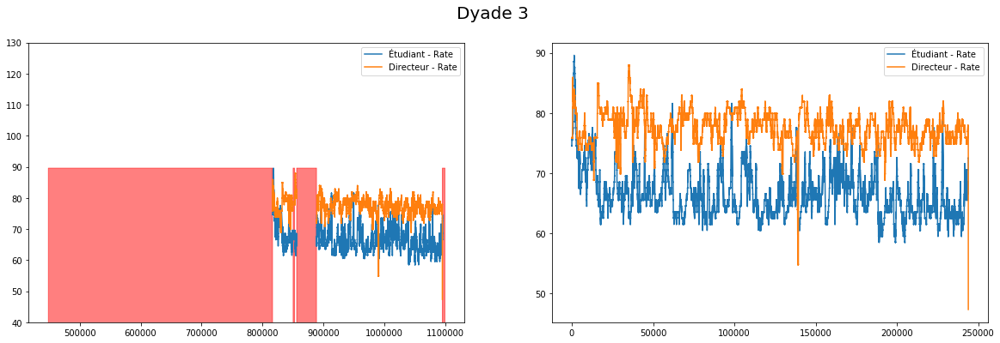

In [21]:
for dyade in sorted(df_all.dyade.unique()[2:3]):
    fig = plt.figure(figsize=(20,6))
    fig.suptitle('Dyade {}'.format(dyade), size=20)
    axs = fig.subplots(1, 2)
    df_dyade = df_all.loc[df_all.dyade==dyade, :].copy()    
    
    df_dyade.loc[:, ['Étudiant - Rate', 'Directeur - Rate']].plot(ax=axs[0])
    valid_mask = df_dyade['Étudiant - Rate Valid'] & df_dyade['Directeur - Rate Valid']
    max_value = np.nanmax(df_dyade.loc[:, ['Étudiant - Rate', 'Directeur - Rate']].values)
    axs[0].fill_between(df_dyade.index, np.bitwise_not(valid_mask) * max_value, where=np.bitwise_not(valid_mask), color='r', alpha=0.5)
    axs[0].set_ylim(40, 130)
    try:
        df_dyade.loc[:, ['Étudiant - Rate', 'Directeur - Rate']].loc[valid_mask, :].plot(use_index=False, ax=axs[1])
    except TypeError:
        pass
    
    plt.show()

## Quel est le pourcentage des données où les rythmes cardiac sont valides pour les deux participants

In [22]:
print("{:0.1%}".format(len(df_all[df_all['Directeur - Rate Valid'] & df_all['Étudiant - Rate Valid']]) / len(df_all)))

82.5%


## Est-ce que les directeurs et les étudiants ont un rythme cardiaque moyen statistiquement différent?

In [23]:
df_average = df_all[df_all['Directeur - Rate Valid'] & df_all['Étudiant - Rate Valid']].groupby('dyade').agg(['mean', 'std'])

df_average.loc[:, [col for col in df_average.columns.droplevel(-1) if 'Rate' in col]]

Étudiant - Rate            Directeur - Rate             \
                 mean        std             mean        std   
dyade                                                          
1           78.432816   4.112685        58.563332   4.936584   
2           77.520996   2.257402        71.967087   4.701267   
3           66.603073   4.109499        77.448738   2.860251   
5           83.809631   4.982140       117.482407   8.319059   
8           66.226303   6.483332        54.158009   3.640915   
9           81.594772   5.371652        57.566540   5.454992   
10          84.291534   5.122199        64.275230   3.389687   
11         103.491257  10.341102        82.683243   6.635984   
13          70.482765   4.145012        71.824310   6.994203   
14          64.354355   4.047028        78.353951  10.554288   
15         100.293343   5.198565        80.059814   4.099225   
16          83.540291   4.880856        67.490707   3.963075   
17          69.907501   4.861773        69.608719   4.669550   
18          71.816216   6.082121        75.103424   4.934348   

      Directeur - Rate Valid      Étudiant - Rate Valid       
                        mean  std                  mean  std  
dyade                                                         
1                       True  0.0                  True  0.0  
2                       True  0.0                  True  0.0  
3                       True  0.0                  True  0.0  
5                       True  0.0                  True  0.0  
8                       True  0.0                  True  0.0  
9                       True  0.0                  True  0.0  
10                      True  0.0                  True  0.0  
11                      True  0.0                  True  0.0  
13                      True  0.0                  True  0.0  
14                      True  0.0                  True  0.0  
15                      True  0.0                  True  0.0  
16                      True  0.0                  True  0.0  
17                      True  0.0                  True  0.0  
18                      True  0.0                  True  0.0

In [24]:
scipy.stats.ttest_ind(df_average['Étudiant - Rate']['mean'], df_average['Directeur - Rate']['mean'])

Ttest_indResult(statistic=1.0361075900475873, pvalue=0.3096929344372693)

Non

## Est-ce que les directeurs et les étudiants ont une variabilité cardiaque moyenne statistiquement différente?

In [25]:
scipy.stats.ttest_ind(df_average['Étudiant - Rate']['std'], df_average['Directeur - Rate']['std'])

Ttest_indResult(statistic=-0.3035259493535403, pvalue=0.7639047062656373)

Non

## Est-ce qu'il y a une corrélation entre les ryhtmes cardiaques

### Global

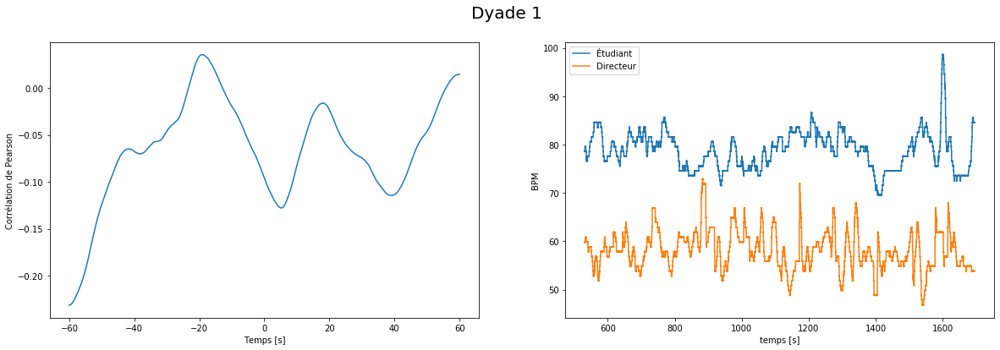

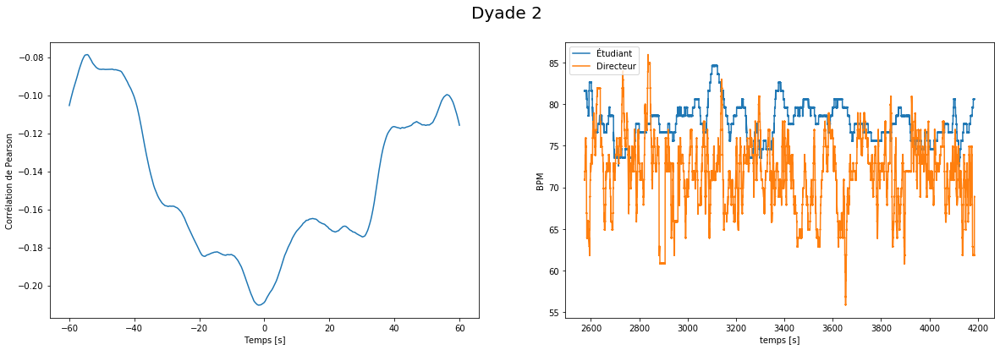

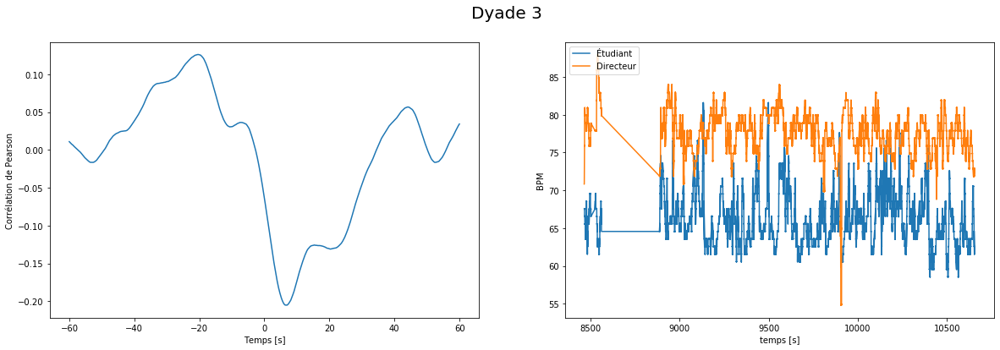

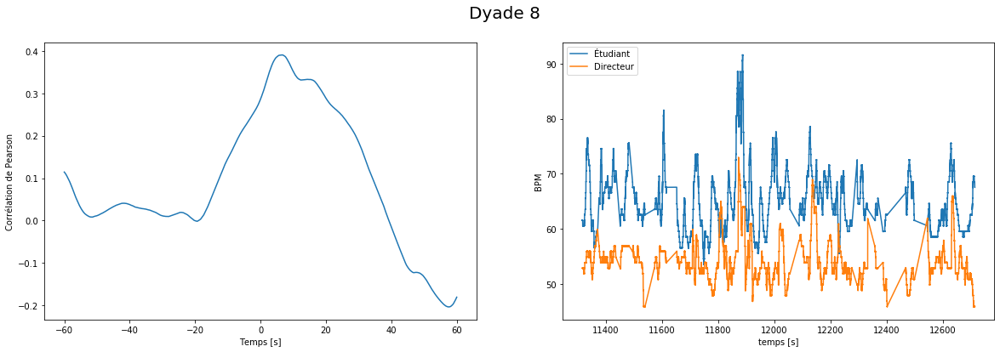

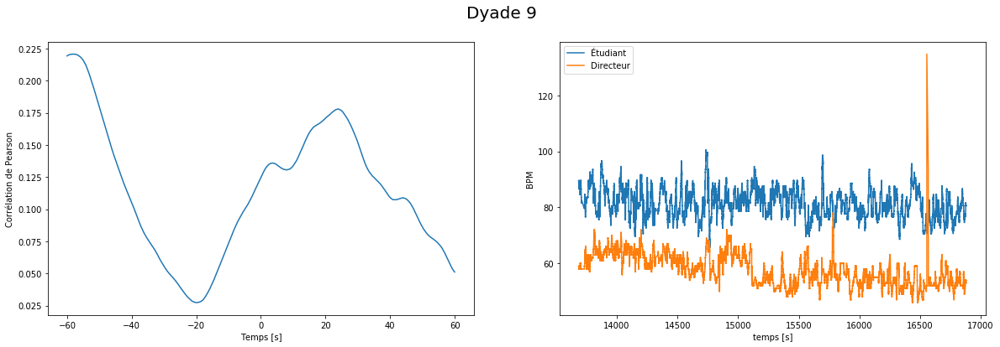

...

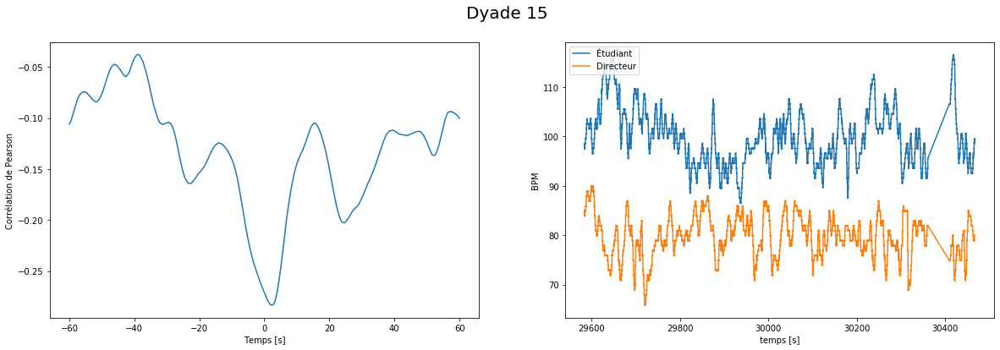

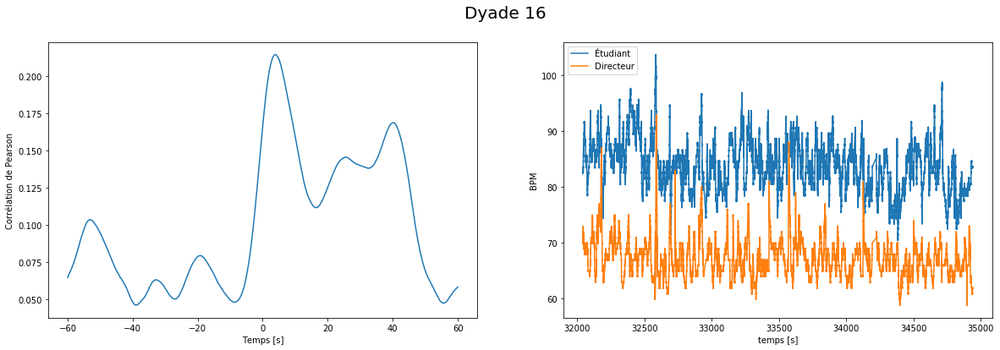

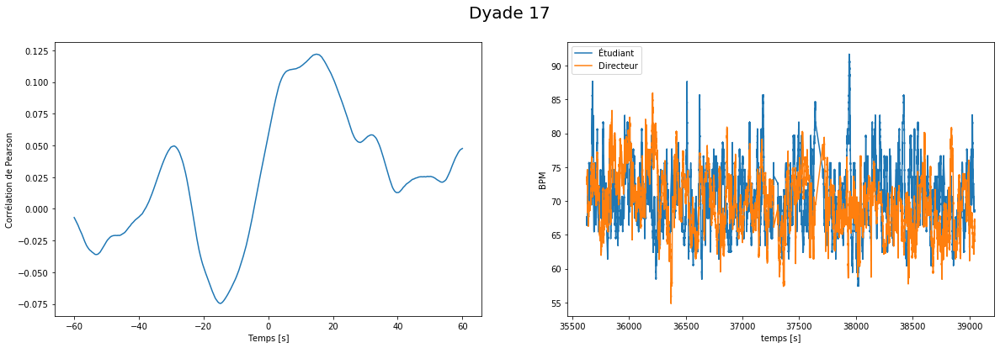

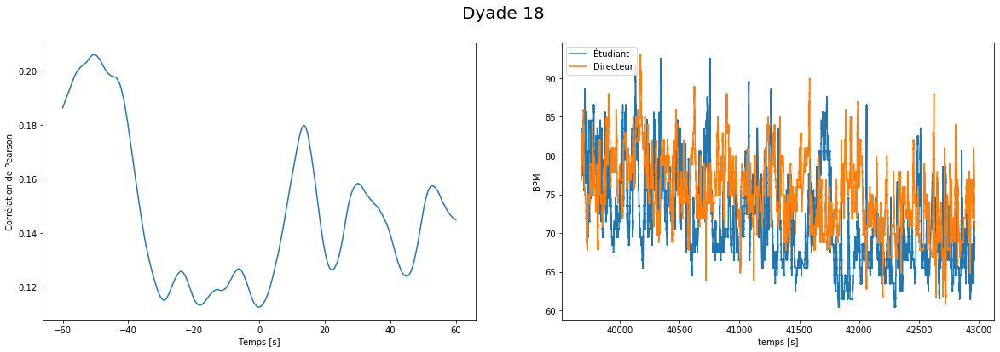

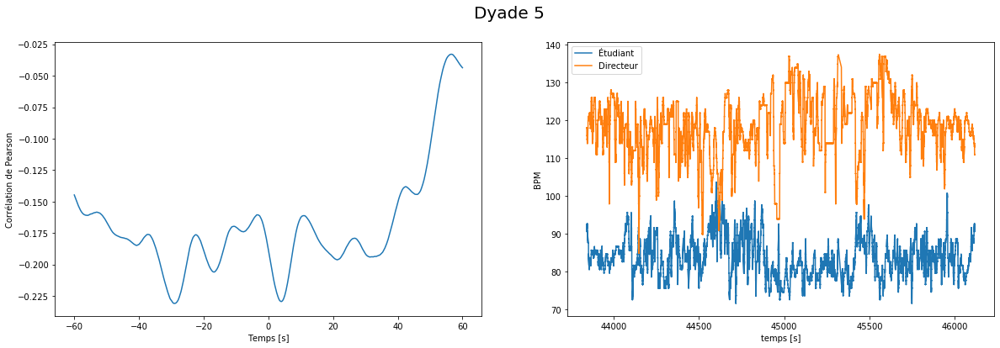

In [26]:
df_valid_rate = df_all.loc[df_all['Directeur - Rate Valid'] & df_all['Étudiant - Rate Valid'], :]
for dyade in df_valid_rate.dyade.unique()[:]:
    df_dyade = df_valid_rate[df_valid_rate.dyade==dyade].iloc[5*6000:5*-6000] # on enlève les 5 première et dernière minutes
    corr = cross_correlation(df_dyade['Directeur - Rate'].values, df_dyade['Étudiant - Rate'].iloc[6000:-6000]) # on fait la cross-corélation à ±60sec
    fig = plt.figure(figsize=(20,6))
    fig.suptitle('Dyade {}'.format(dyade), size=20)
    axs = fig.subplots(1, 2)
    axs[0].plot(np.arange(-len(corr)//2,len(corr)//2)/100,  corr)
    axs[0].set_xlabel('Temps [s]')
    axs[0].set_ylabel('Corrélation de Pearson')
    
    axs[1].plot(df_dyade['Étudiant - Rate'].index/100, df_dyade['Étudiant - Rate'].values)
    axs[1].plot(df_dyade['Directeur - Rate'].index/100, df_dyade['Directeur - Rate'].values)
    axs[1].legend(['Étudiant', 'Directeur'], loc='upper left')
    axs[1].set_ylabel('BPM')
    axs[1].set_xlabel('temps [s]')
    plt.show()

Pour certain, Négative et Positive, d'autre non  
Il faudrait comparer avec les corélations entre participant qui ne sont pas dans la même dyade

### Local

In [27]:
df_valid_rate = df_all.loc[df_all['Directeur - Rate Valid'] & df_all['Étudiant - Rate Valid'], :]
df_all['rate correlation'] = np.nan
window_length = 20*FREQ
for dyade in df_valid_rate.dyade.unique()[:]:
    df_dyade = df_valid_rate[df_valid_rate.dyade==dyade].iloc[5*6000:5*-6000] # on enlève les 5 première et dernière minutes
    df_dyade = df_dyade[['Directeur - Rate', 'Étudiant - Rate']]
    c = df_dyade.rolling(window_length, min_periods=window_length, center=True).corr()
    df_all.loc[df_dyade.index, 'rate correlation'] = c.swaplevel().loc['Directeur - Rate', 'Étudiant - Rate']

# Eda

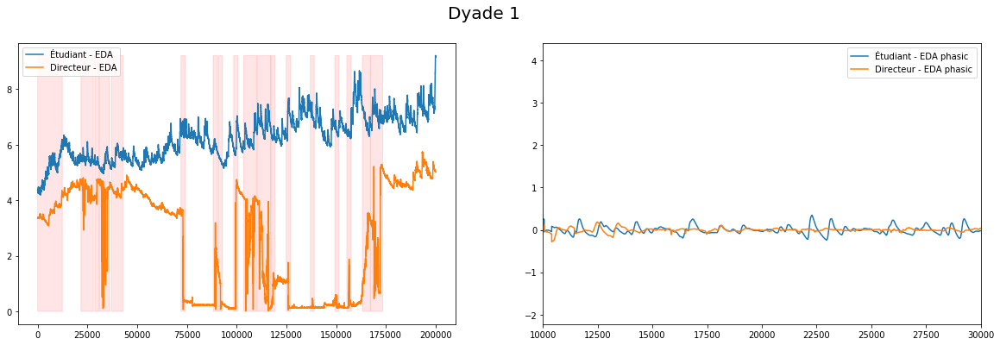

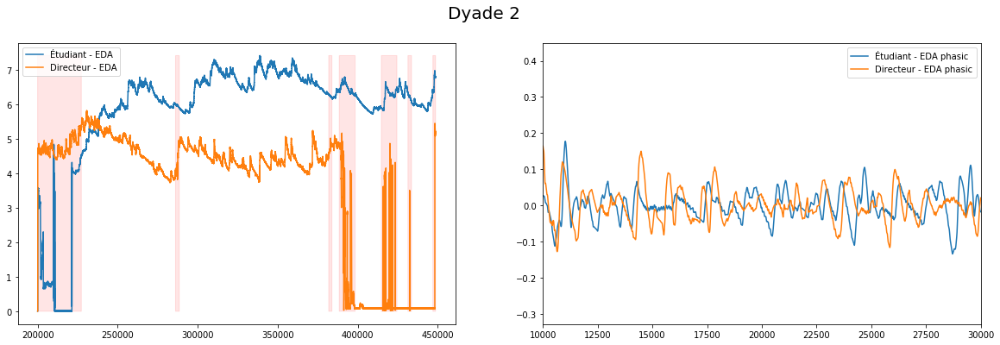

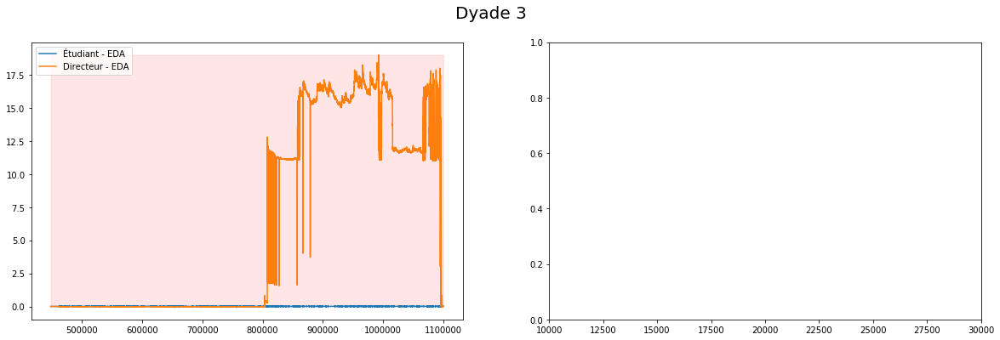

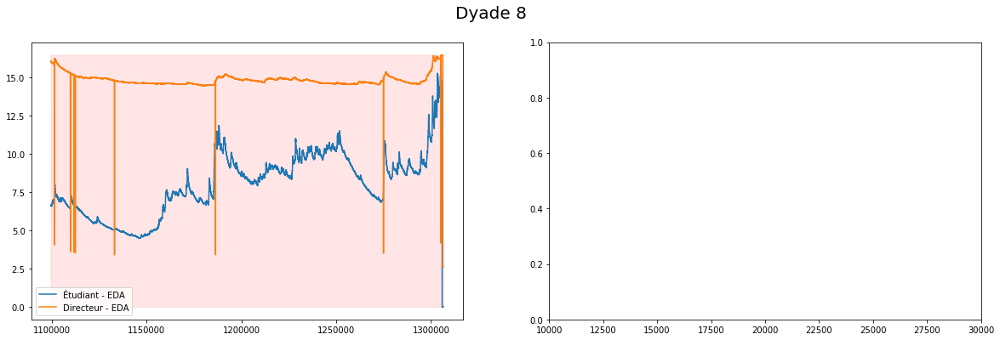

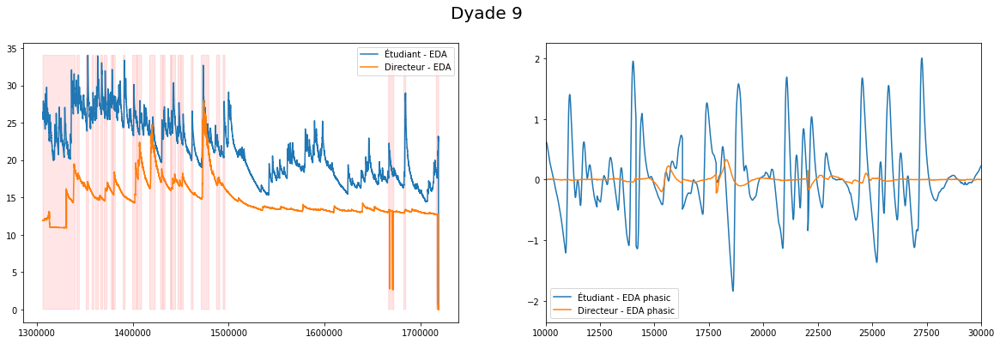

...

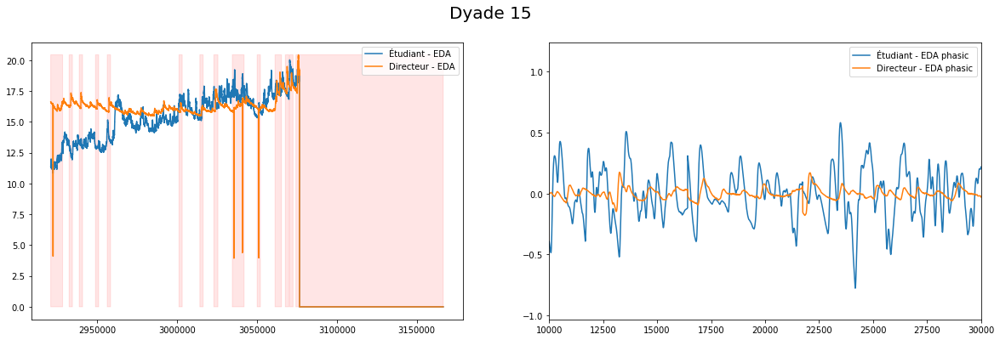

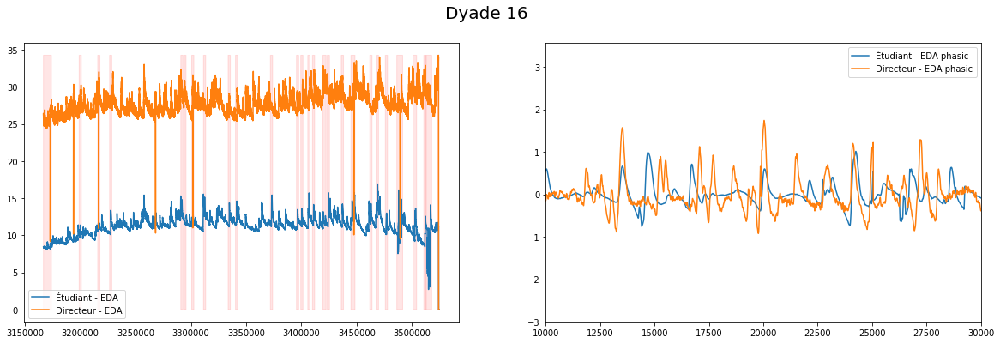

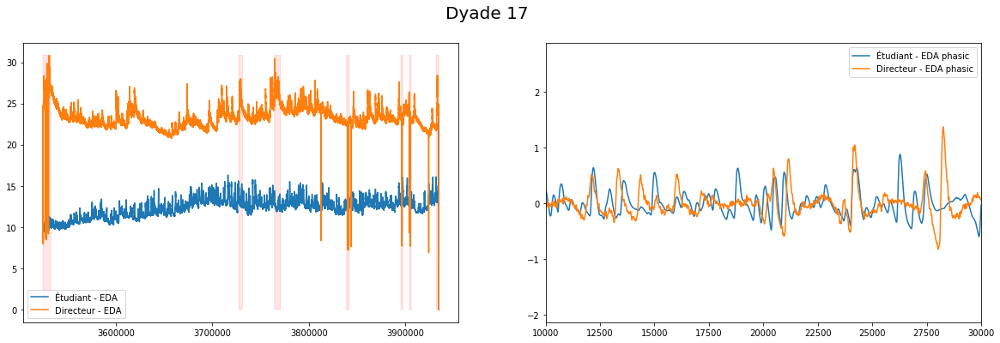

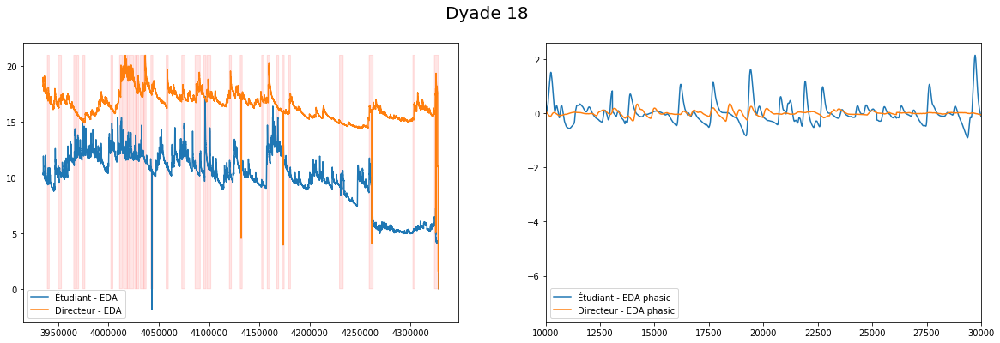

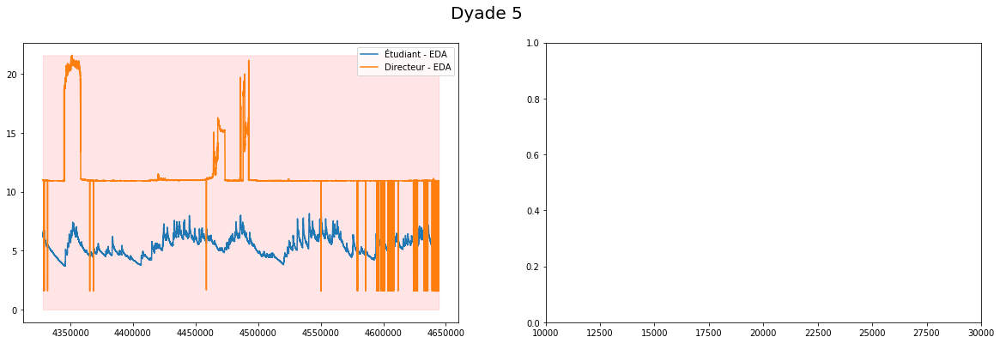

In [28]:
for dyade in df_all.dyade.unique()[:]:
    fig = plt.figure(figsize=(20,6))
    fig.suptitle('Dyade {}'.format(dyade), size=20)
    axs = fig.subplots(1, 2)
    
    df_dyade = df_all.loc[df_all.dyade==dyade, :].copy()
    df_dyade.loc[:, ['Étudiant - EDA', 'Directeur - EDA']].plot(ax=axs[0])
    valid_mask = df_dyade['Étudiant - EDA valid'] & df_dyade['Directeur - EDA valid']
    max_value = np.nanmax(df_dyade.loc[:, ['Étudiant - EDA', 'Directeur - EDA']].values)
    axs[0].fill_between(df_dyade.index, np.bitwise_not(valid_mask) * max_value, where=np.bitwise_not(valid_mask), color='r', alpha=0.1)
    
    try:
        df_dyade.loc[:, ['Étudiant - EDA phasic', 'Directeur - EDA phasic']].loc[valid_mask, :].plot(use_index=False, ax=axs[1])
    except TypeError:
        pass
    
    axs[1].set_xlim(10000, 30000)
    plt.show()

## Quel est le pourcentage des données où les EDA sont valides pour les deux participants

In [29]:
print("{:0.1%}".format(len(df_all[df_all['Directeur - EDA valid'] & df_all['Étudiant - EDA valid']]) / len(df_all)))

56.6%


## Est-ce qu'il y a une corrélation entre la composante phasique de l'EDA?

### Global

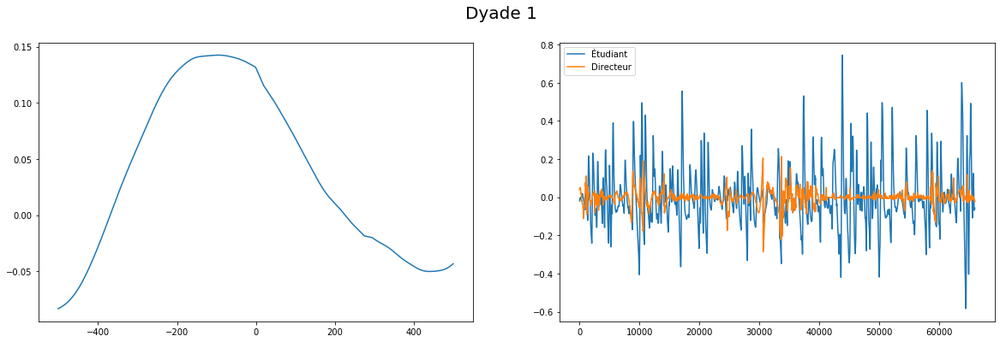

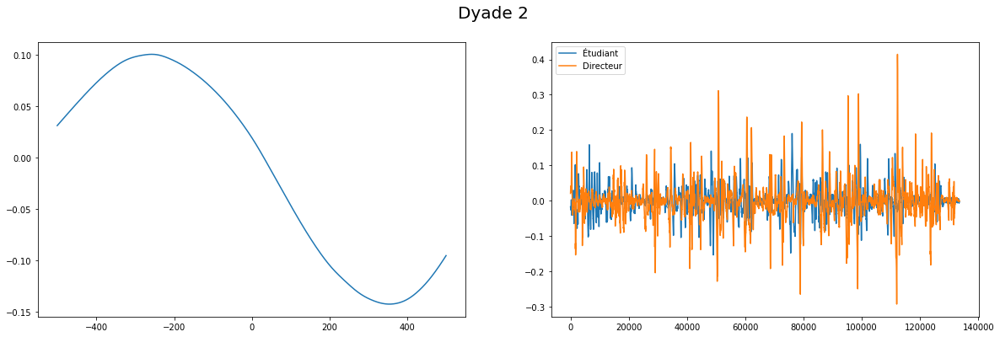

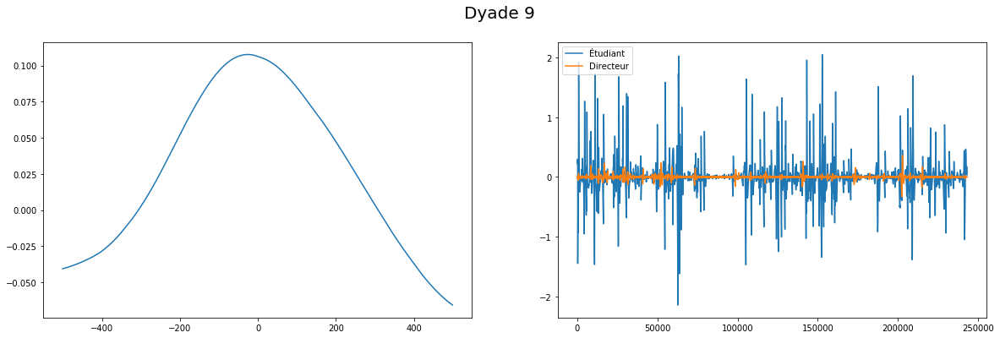

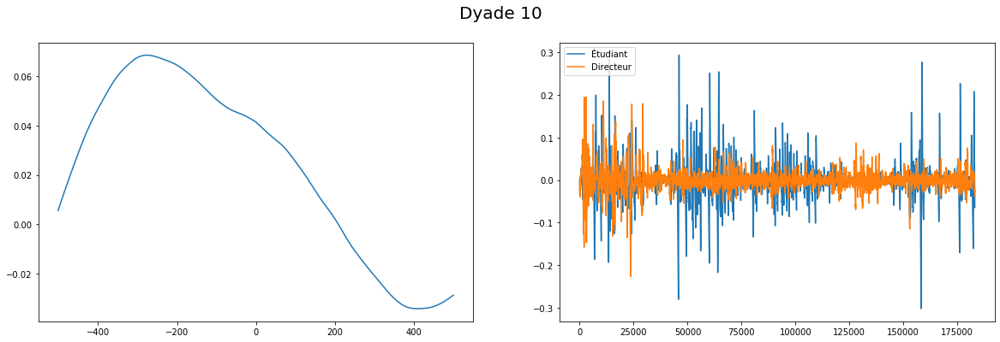

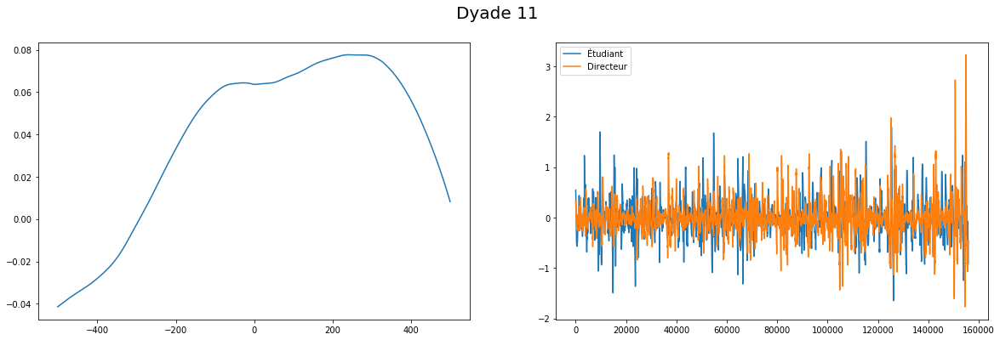

...

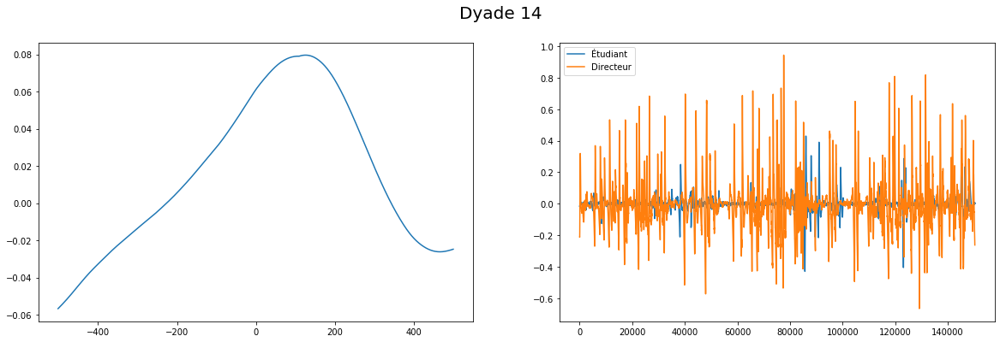

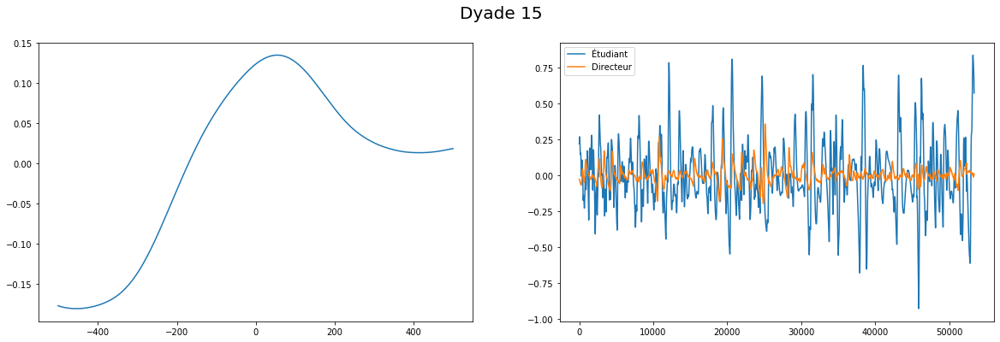

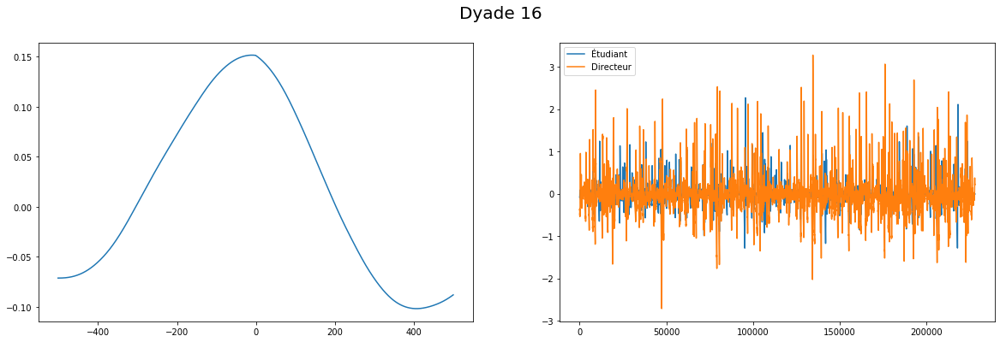

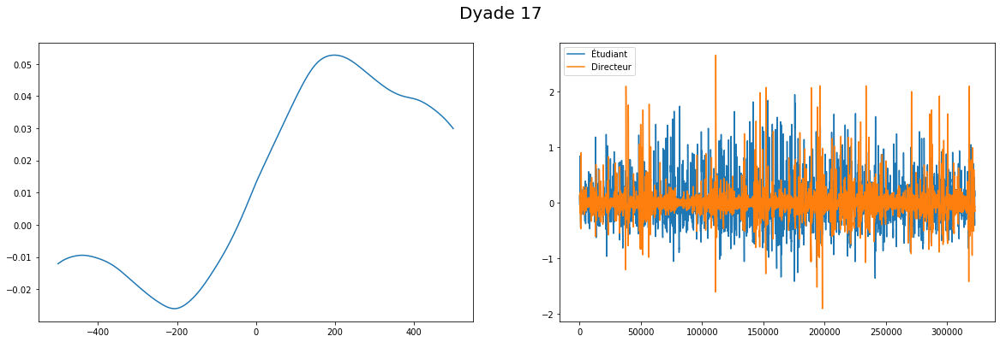

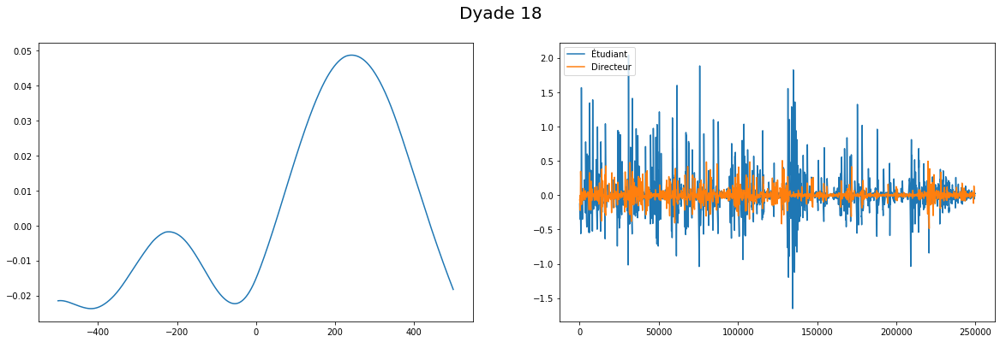

In [30]:
df_valid_eda = df_all[df_all['Directeur - EDA valid'] & df_all['Étudiant - EDA valid']]
for dyade in df_valid_eda.dyade.unique()[:]:
    df_dyade = df_valid_eda[df_valid_eda.dyade==dyade].iloc[5*6000:5*-6000] # on enlève les 5 première et dernière minutes
    corr = cross_correlation(df_dyade['Directeur - EDA phasic'].values, df_dyade['Étudiant - EDA phasic'].iloc[500:-500]) # on fait la cross-corélation à ±5sec
    fig = plt.figure(figsize=(20,6))
    fig.suptitle('Dyade {}'.format(dyade), size=20)
    axs = fig.subplots(1, 2)
    axs[0].plot(np.arange(-len(corr)//2,len(corr)//2),  corr)
    axs[1].plot(df_dyade['Étudiant - EDA phasic'].values)
    axs[1].plot(df_dyade['Directeur - EDA phasic'].values)
    axs[1].legend(['Étudiant', 'Directeur'], loc='upper left')
    plt.show()

Pas vraiment

### Local

In [31]:
df_valid_rate = df_all.loc[df_all.loc[:, 'Directeur - EDA valid'] & df_all['Étudiant - EDA valid'], :]
df_all['eda correlation'] = np.nan
window_length = 20*FREQ
for dyade in df_valid_rate.dyade.unique()[:]:
    df_dyade = df_valid_rate[df_valid_rate.dyade==dyade].iloc[5*6000:5*-6000] # on enlève les 5 première et dernière minutes
    df_dyade = df_dyade[['Directeur - EDA phasic', 'Étudiant - EDA phasic']]
    c = df_dyade.rolling(window_length, min_periods=window_length, center=True).corr()
    df_all.loc[df_dyade.index, 'eda correlation'] = c.swaplevel().loc['Directeur - EDA phasic', 'Étudiant - EDA phasic']

## Behaviour Point event

In [32]:
b, a = signal.butter(1, 0.015)

In [33]:
def plot_val(val, color=None, label=None, filtering=False):
    val = val - val[FREQ * 10]
    if filtering:
        val = signal.filtfilt(b, a, val)

    plt.plot(val, alpha=0.5, color=color, label=label)

### Heart Rate

#### Étudiant - Directeur

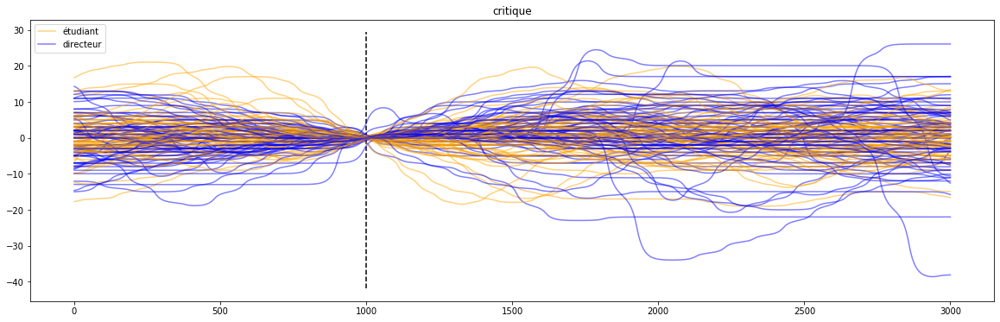

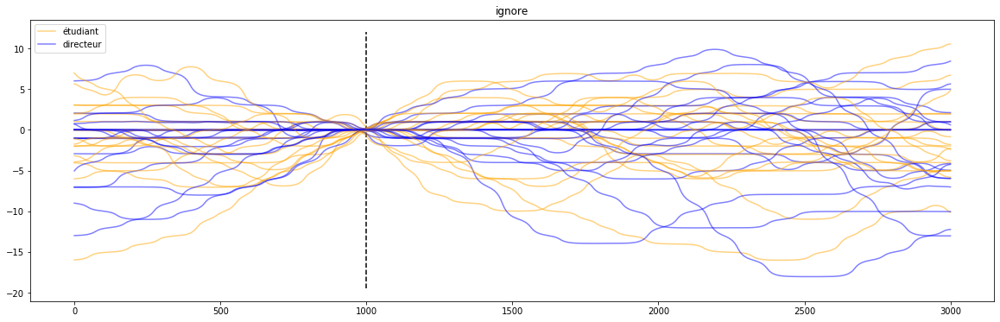

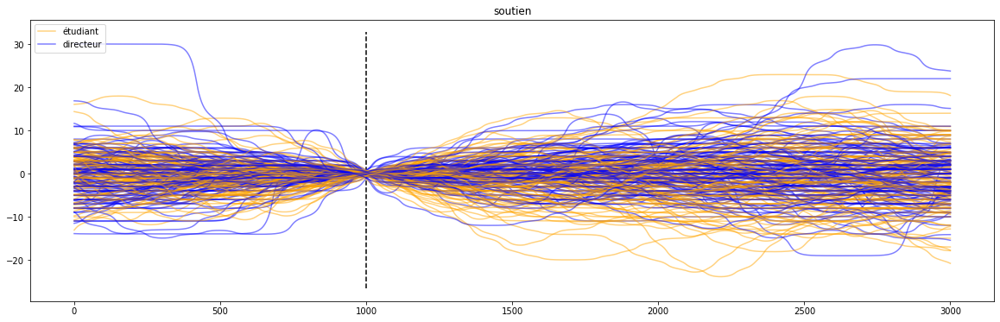

In [34]:
for cat in df_all.Behavior_point_clean.cat.categories.drop(''):
    fig = plt.figure(figsize=(20,6))
    for row in df_all.index[(df_all.Behavior_point_clean==cat)]:
        start_row = row - FREQ * 10 
        end_row = row + FREQ * 20
        df_selec = df_all.loc[start_row:end_row].copy()
        if any(~df_selec['Directeur - Rate Valid'] | ~df_selec['Étudiant - Rate Valid']):
            pass
        else:
            plot_val(df_selec['Étudiant - Rate'].values, color='orange', label='étudiant', filtering=True)
            plot_val(df_selec['Directeur - Rate'].values, color='blue', label='directeur', filtering=True)
        #plt.vlines(FREQ*10, 40, 100)
    plt.vlines(FREQ*10, *plt.ylim(), linestyles='--')
    plt.title(cat)
    plt.legend(['étudiant', 'directeur'], loc='upper left')
    plt.show()
    


#### Étudiants

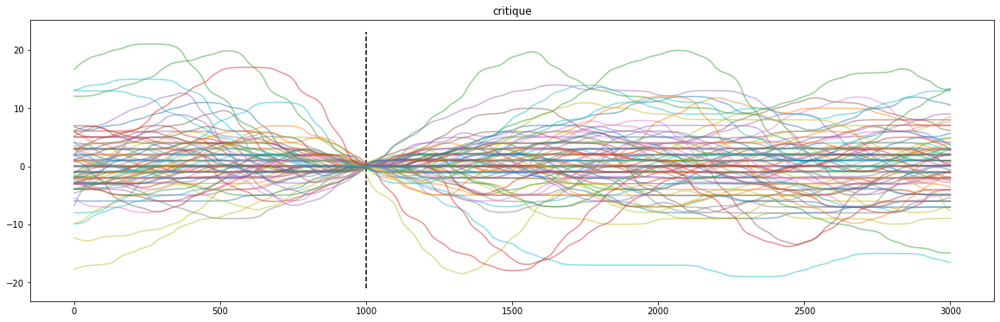

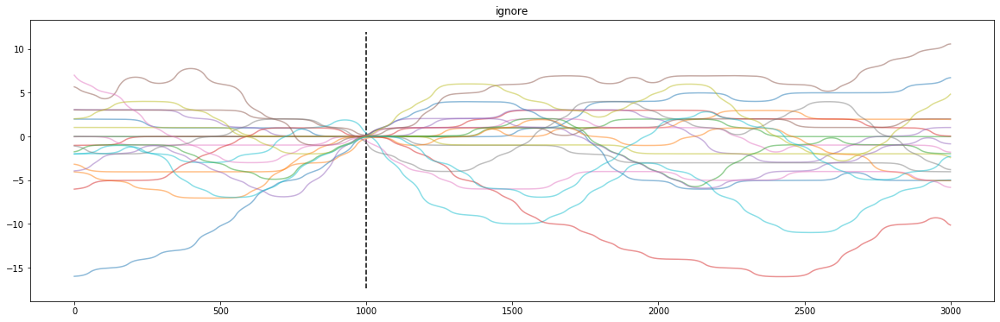

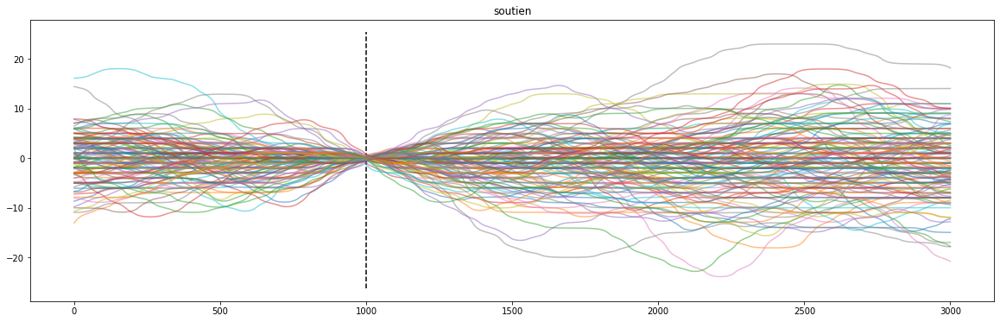

In [35]:
for cat in df_all.Behavior_point_clean.cat.categories.drop(''):
    fig = plt.figure(figsize=(20,6))
    for row in df_all.index[(df_all.Behavior_point_clean==cat)]:
        start_row = row - FREQ * 10 
        end_row = row + FREQ * 20
        df_selec = df_all.loc[start_row:end_row].copy()
        if any(~df_selec['Étudiant - Rate Valid']):
            continue
        plot_val(df_selec['Étudiant - Rate'].values, filtering=True)
        #plot_val(df_selec['Directeur - Rate'].values, color='blue')

    plt.vlines(FREQ*10, *plt.ylim(), linestyles='--')
    plt.title(cat)
    plt.show()

### EDA

### Phasic

#### Étudiant - Directeur

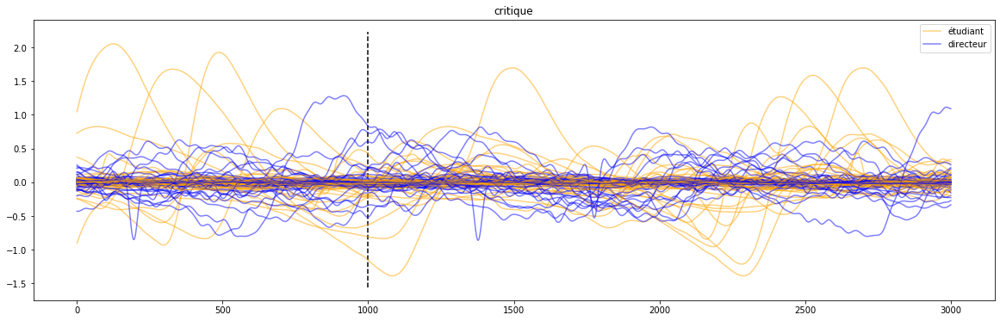

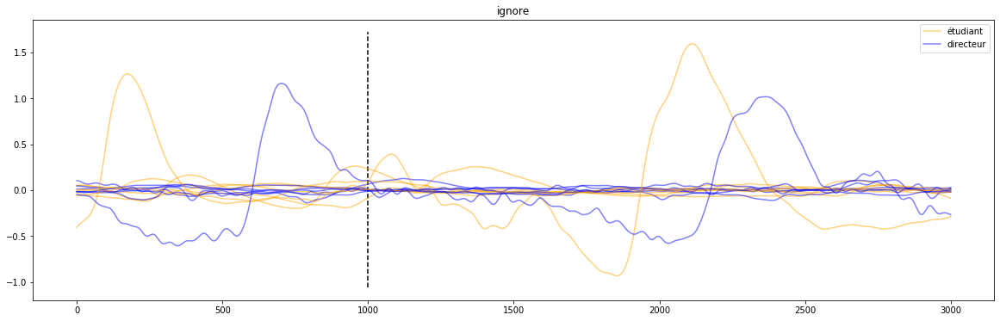

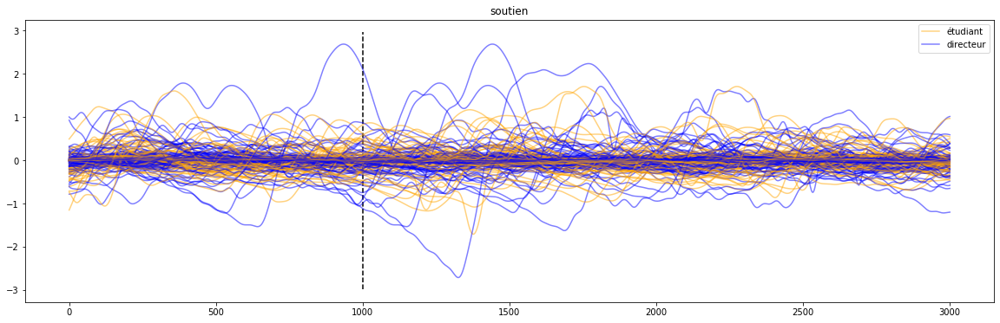

In [36]:
for cat in df_all.Behavior_point_clean.cat.categories.drop(''):
    fig = plt.figure(figsize=(20,6))
    for row in df_all.index[(df_all.Behavior_point_clean==cat)]:
        start_row = row - FREQ * 10 
        end_row = row + FREQ * 20
        df_selec = df_all.loc[start_row:end_row].copy()
        if any(~df_selec['Directeur - EDA valid'] | ~df_selec['Étudiant - EDA valid']):
            continue
        plt.plot(df_selec['Étudiant - EDA phasic'].values, color='orange', alpha=0.5)
        plt.plot(df_selec['Directeur - EDA phasic'].values, color='blue', alpha=0.5)
    
    plt.vlines(FREQ*10, *plt.ylim(), linestyles='--')
    plt.legend(['étudiant', 'directeur'], loc='upper right')
    plt.title(cat)
    plt.show()
    


#### Étudiants

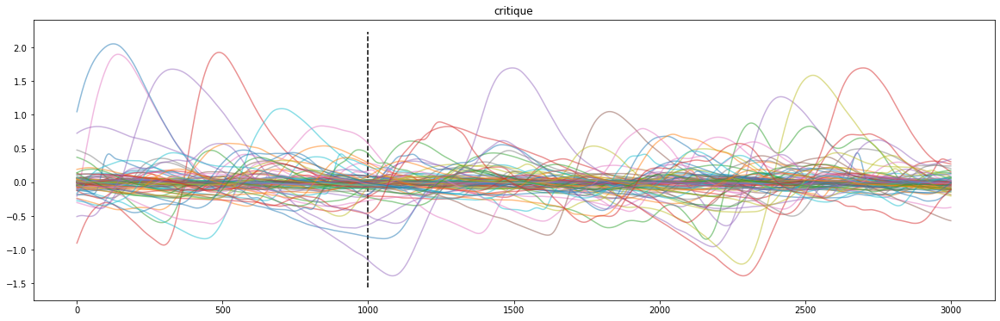

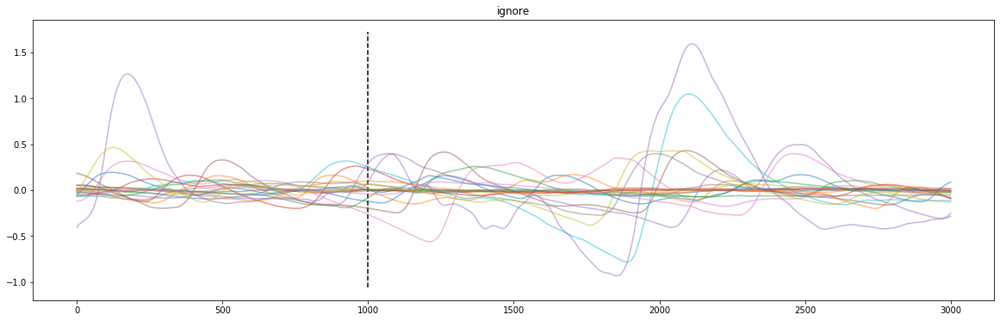

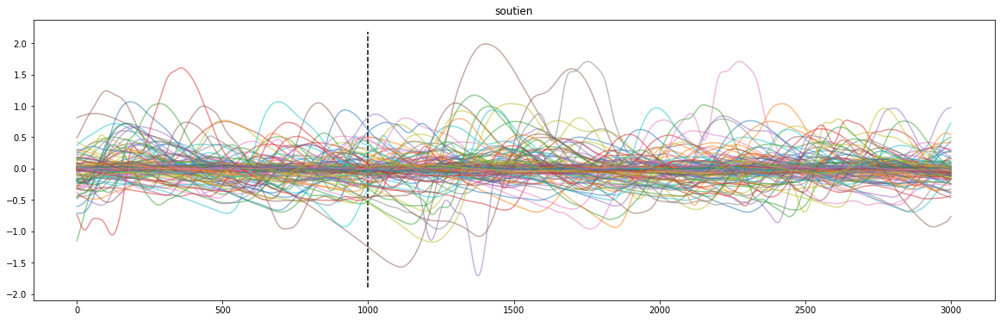

In [37]:
for cat in df_all.Behavior_point_clean.cat.categories.drop(''):
    fig = plt.figure(figsize=(20,6))
    for row in df_all.index[(df_all.Behavior_point_clean==cat)]:
        start_row = row - FREQ * 10 
        end_row = row + FREQ * 20
        df_selec = df_all.loc[start_row:end_row].copy()
        if any(~df_selec['Étudiant - EDA valid']):
            continue
        plt.plot(df_selec['Étudiant - EDA phasic'].values, alpha=0.5)
        #plot_val(df_selec['Directeur - Rate'].values, color='blue')
    
    plt.vlines(FREQ*10, *plt.ylim(), linestyles='--')
    plt.title(cat)
    plt.show()

### Tonic

#### Étudiant - Directeur

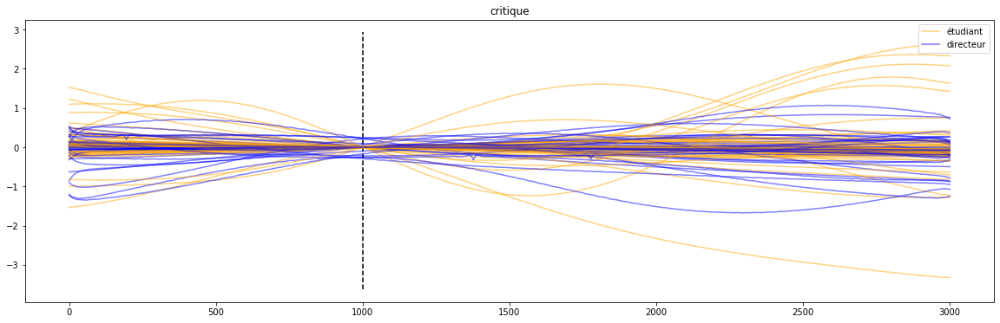

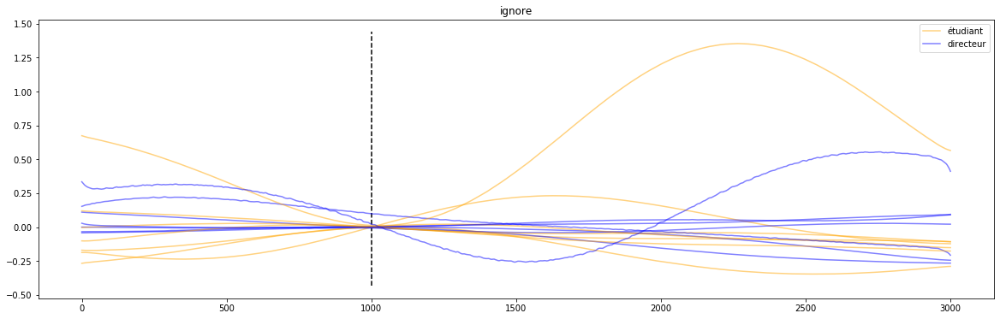

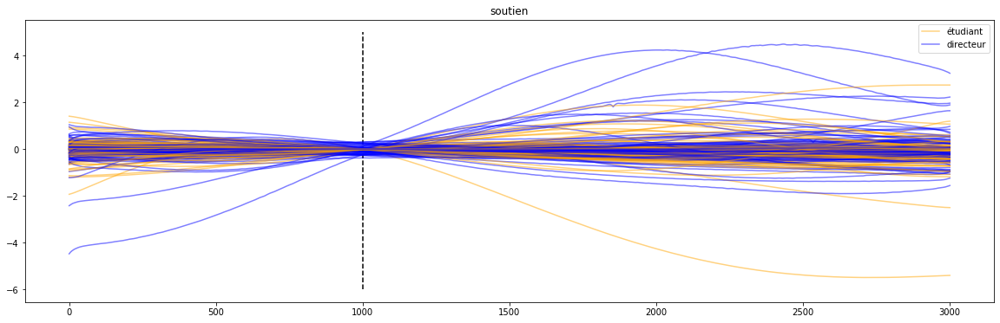

In [38]:
for cat in df_all.Behavior_point_clean.cat.categories.drop(''):
    fig = plt.figure(figsize=(20,6))
    for row in df_all.index[(df_all.Behavior_point_clean==cat)]:
        start_row = row - FREQ * 10 
        end_row = row + FREQ * 20
        df_selec = df_all.loc[start_row:end_row].copy()
        if any(~df_selec['Directeur - EDA valid'] | ~df_selec['Étudiant - EDA valid']):
            continue
        plot_val(df_selec['Étudiant - EDA tonic'].values, color='orange', filtering=True)
        plot_val(df_selec['Directeur - EDA tonic'].values, color='blue', filtering=True)
    
    plt.vlines(FREQ*10, *plt.ylim(), linestyles='--')
    plt.legend(['étudiant', 'directeur'], loc='upper right')
    plt.title(cat)
    plt.show()
    


#### Étudiants

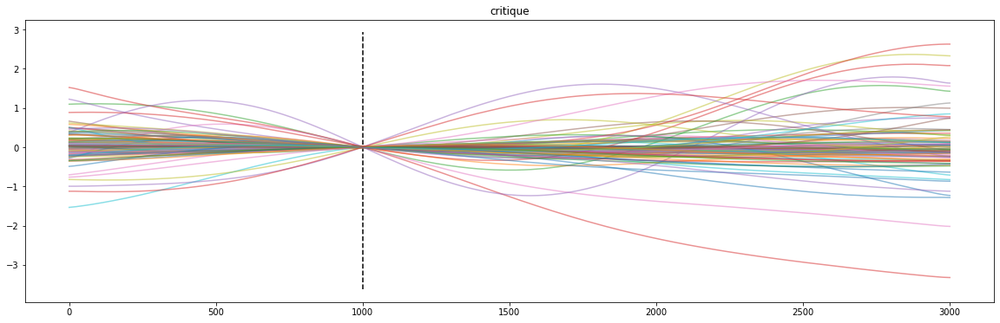

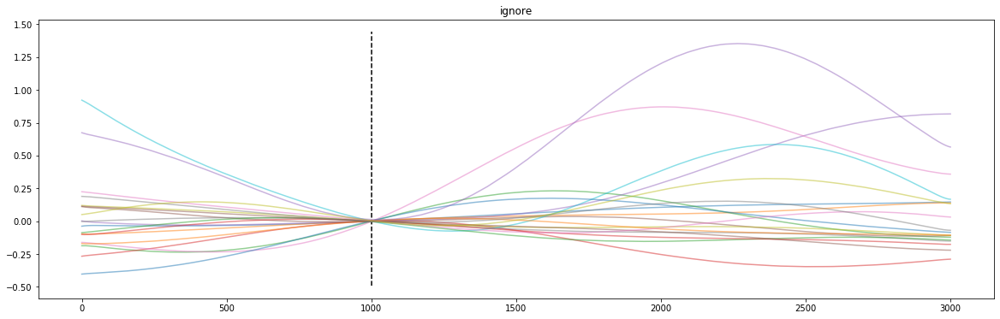

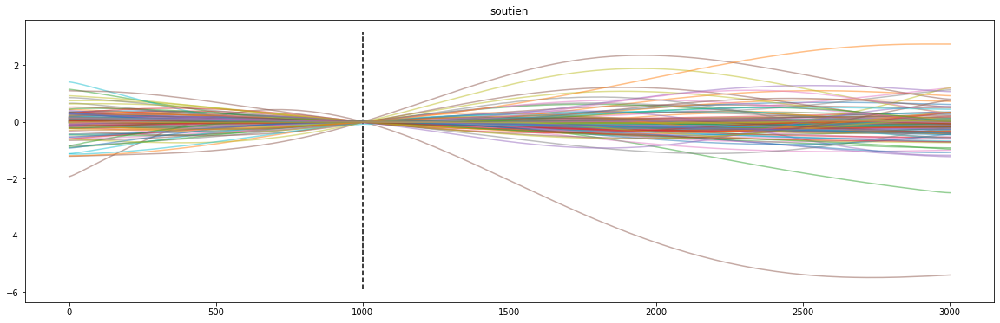

In [39]:
for cat in df_all.Behavior_point_clean.cat.categories.drop(''):
    fig = plt.figure(figsize=(20,6))
    for row in df_all.index[(df_all.Behavior_point_clean==cat)]:
        start_row = row - FREQ * 10 
        end_row = row + FREQ * 20
        df_selec = df_all.loc[start_row:end_row].copy()
        if any(~df_selec['Étudiant - EDA valid']):
            continue
        plot_val(df_selec['Étudiant - EDA tonic'].values, filtering=True)
        #plot_val(df_selec['Directeur - Rate'].values, color='blue')
    
    plt.vlines(FREQ*10, *plt.ylim(), linestyles='--')
    plt.title(cat)
    plt.show()

## State Event and Physio

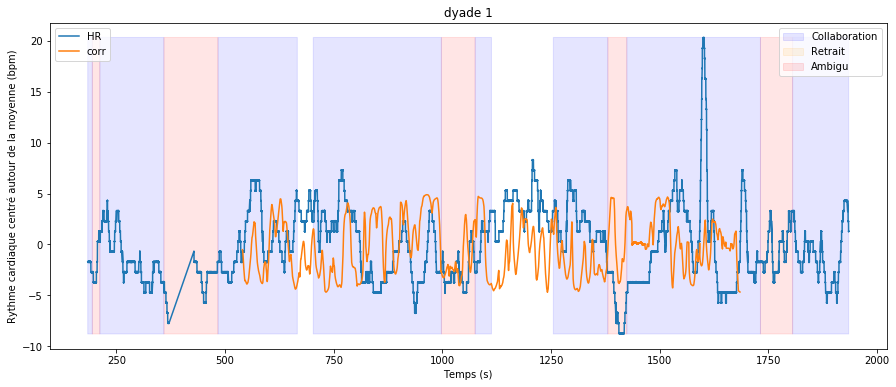

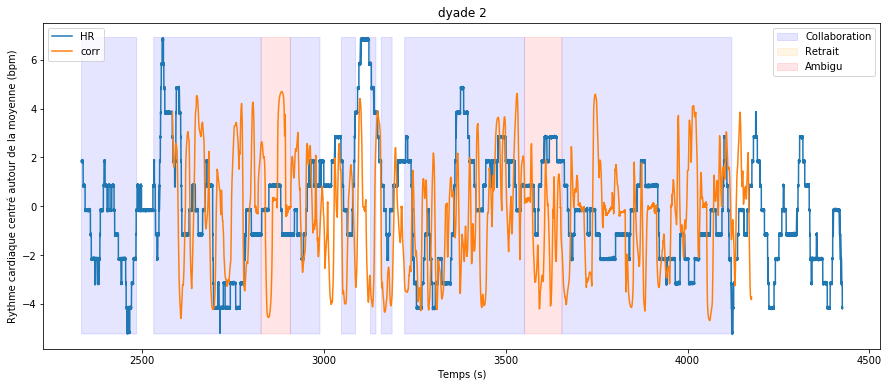

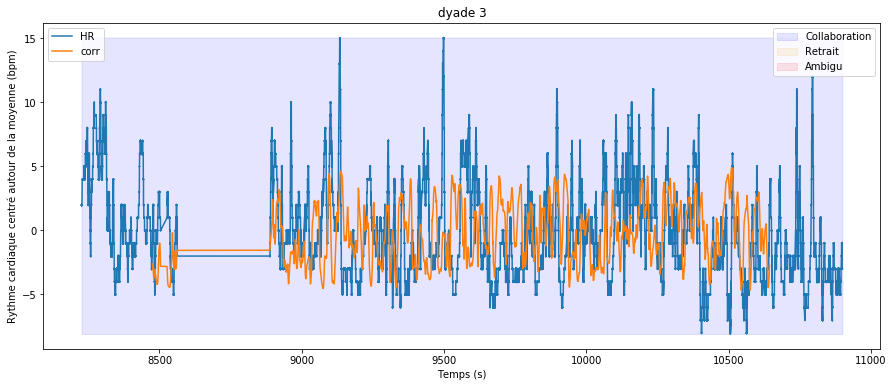

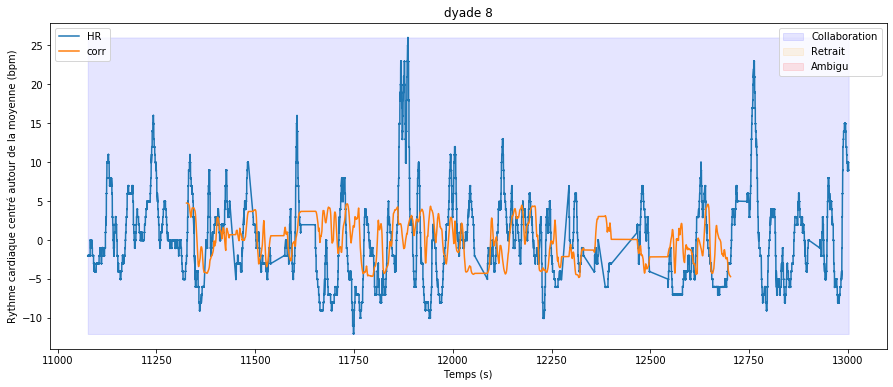

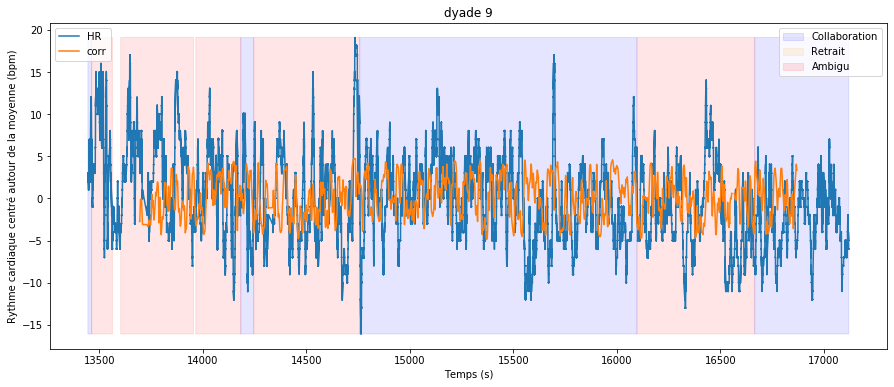

...

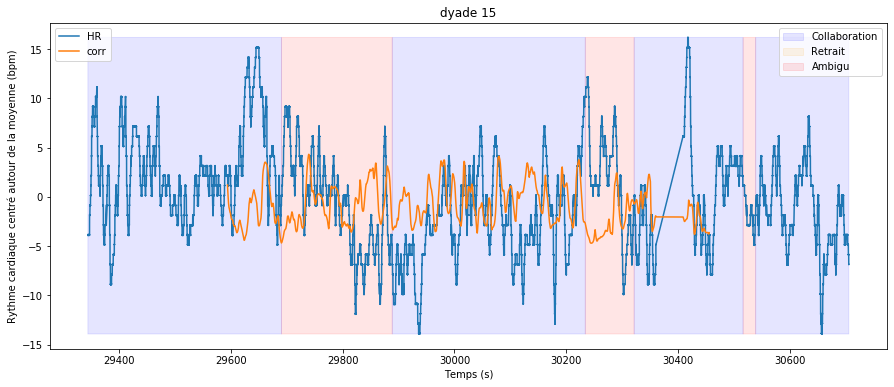

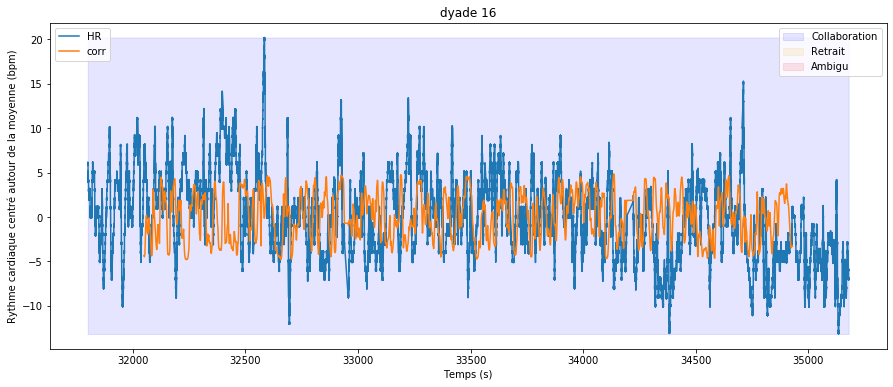

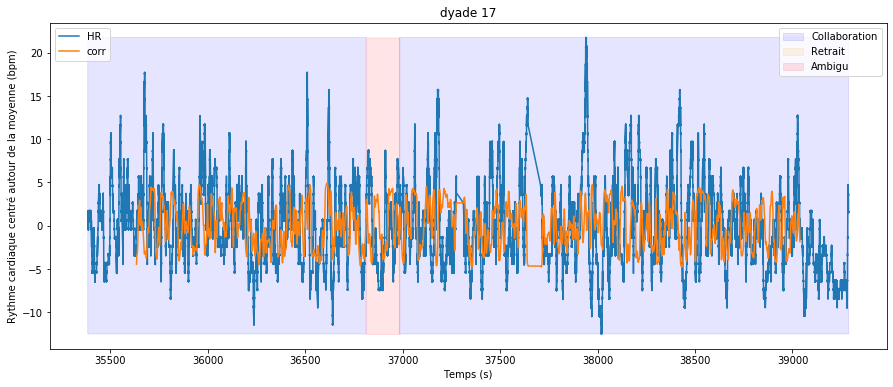

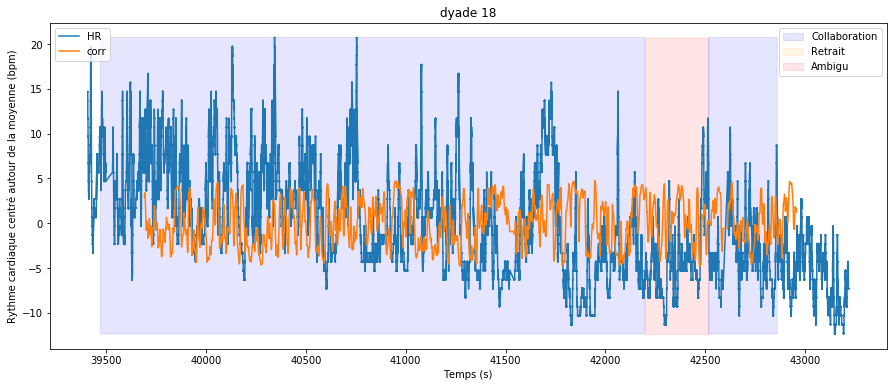

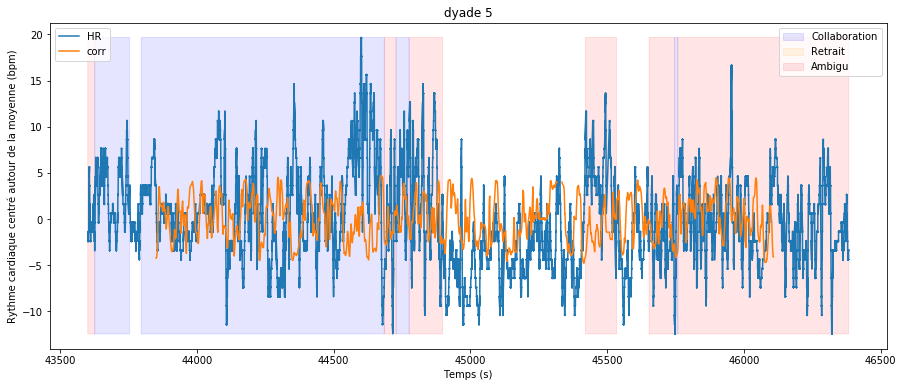

In [40]:
start, stop = 6000, -6000
df_all['Étudiant - Rate Norm'] = np.nan

for dyade in df_all.dyade.unique()[:]:
    selection_index = df_all.index[(df_all.dyade == dyade) & df_all['Étudiant - Rate Valid']][start:stop]
    df_dyade = df_all.loc[selection_index]
    df_dyade.index /= 100
    fig = plt.figure(figsize=(15,6))
    rate = df_dyade["Étudiant - Rate"]
    rate -= rate.mean()
    df_all.loc[selection_index, 'Étudiant - Rate Norm'] = (rate/rate.std(skipna=True)).values
    pa = rate.plot()
    pb = (df_dyade['rate correlation']*5).plot()
    event = df_dyade.Behavior_clean.cat.codes
    p1 = plt.fill_between(rate.index, (event==1).astype(float) * np.max(rate), (event==1).astype(float) * np.min(rate), where=(event==1), color='r', alpha=0.1) # ambigu
    p2 = plt.fill_between(rate.index, (event==2).astype(float) * np.max(rate), (event==2).astype(float) * np.min(rate), where=(event==2), color='b', alpha=0.1) # collaboration
    p3 = plt.fill_between(rate.index, (event==9).astype(float) * np.max(rate), (event==9).astype(float) * np.min(rate), where=(event==9), color='orange', alpha=0.1) #retrait
    plt.xlabel('Temps (s)')
    plt.ylabel('Rythme cardiaque centré autour de la moyenne (bpm)')
    legend1 = plt.legend([p2, p3, p1], ['Collaboration', 'Retrait', 'Ambigu'], loc='upper right')
    plt.legend(pb.lines, ['HR', 'corr'], loc='upper left')
    plt.gca().add_artist(legend1)
    plt.title(f'dyade {dyade}')
    if dyade == 1:
        plt.savefig('RythmeCardiaqueState.png')
    

In [41]:
ets = np.linspace(0,4, 10)
bc_high_rates = []
for et in ets:
    bc_high_rate = df_all[df_all['Étudiant - Rate Norm'] > et].Behavior_clean.value_counts().loc[['collaboration', 'ambigu', 'retrait']]
    bc_high_rate /= bc_high_rate.sum()
    bc_high_rate.name = et
    bc_high_rates.append(bc_high_rate)

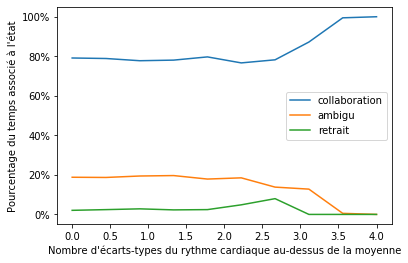

In [42]:
pd.concat(bc_high_rates, axis=1).T.plot()
plt.xlabel("Nombre d'écarts-types du rythme cardiaque au-dessus de la moyenne")
plt.ylabel("Pourcentage du temps associé à l'état")
plt.gca().set_yticklabels(['{:,.0%}'.format(x) for x in plt.gca().get_yticks()])
plt.savefig('HighHeartRateAssociation.png')
plt.show()

In [43]:
bc_high_rates = pd.DataFrame()
bc_high_rates
bc_high_rates.append(bc_high_rate)

,ambigu,collaboration,retrait
4.0,0.0,1.0,0.0


# Point Event

### EDA étudiant

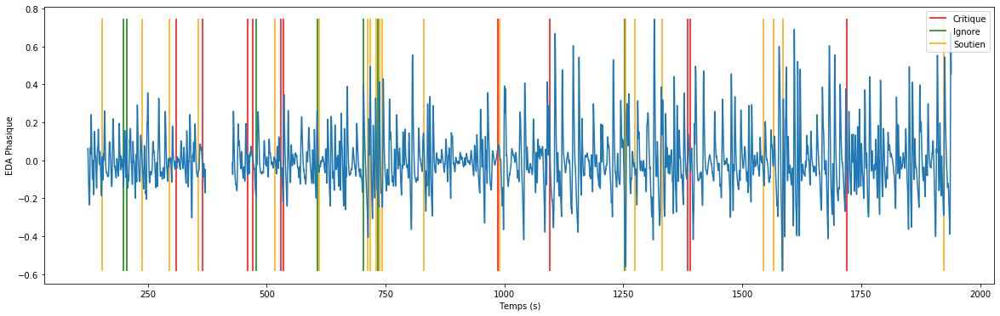

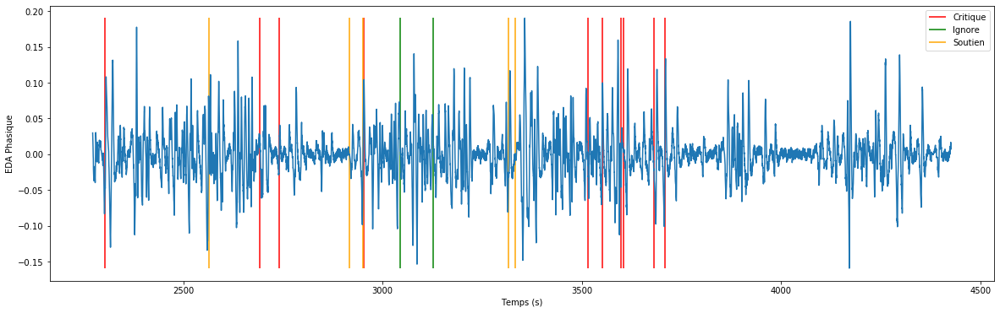

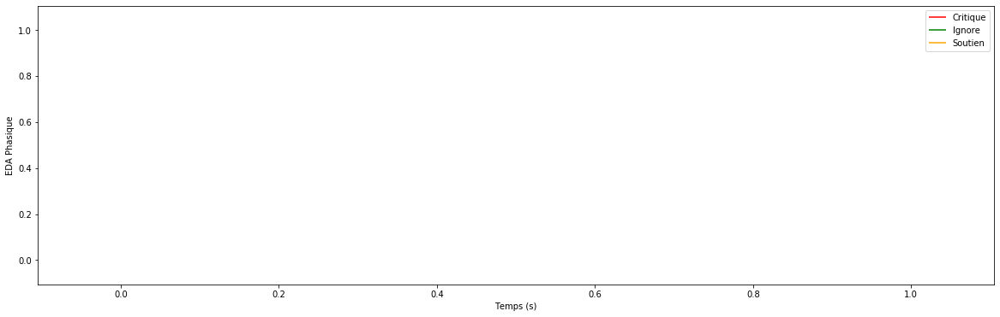

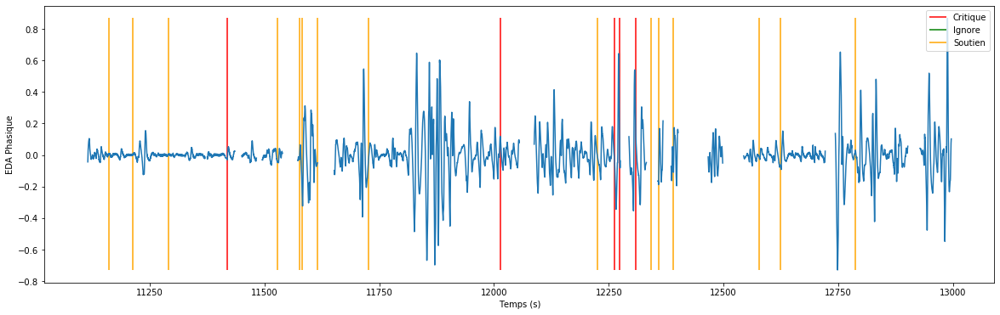

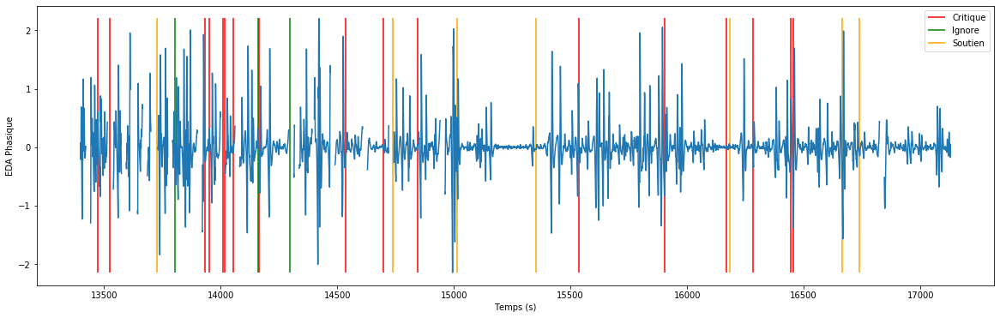

...

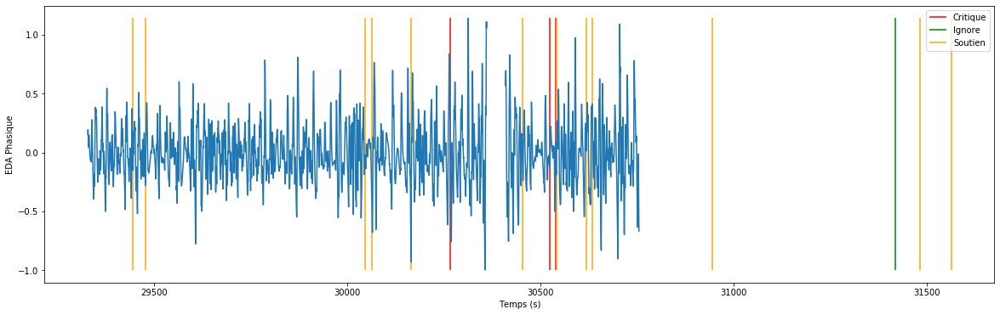

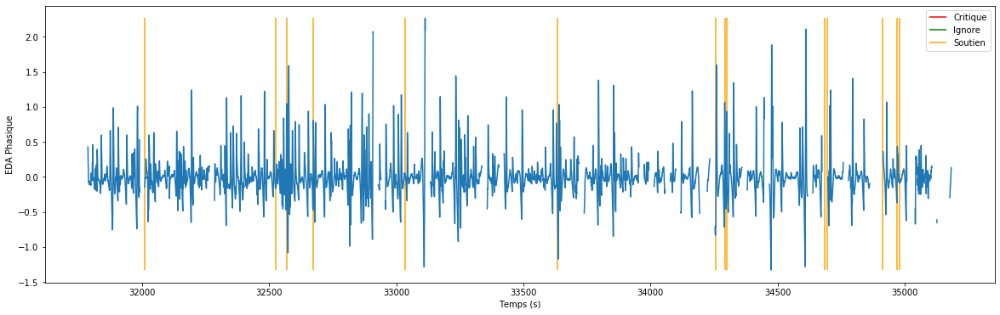

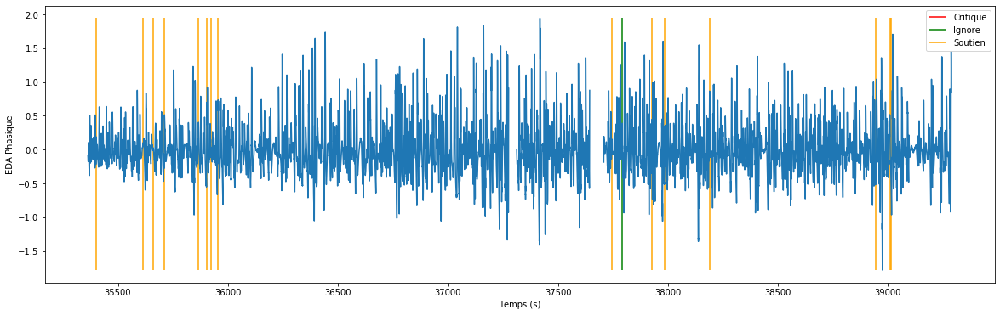

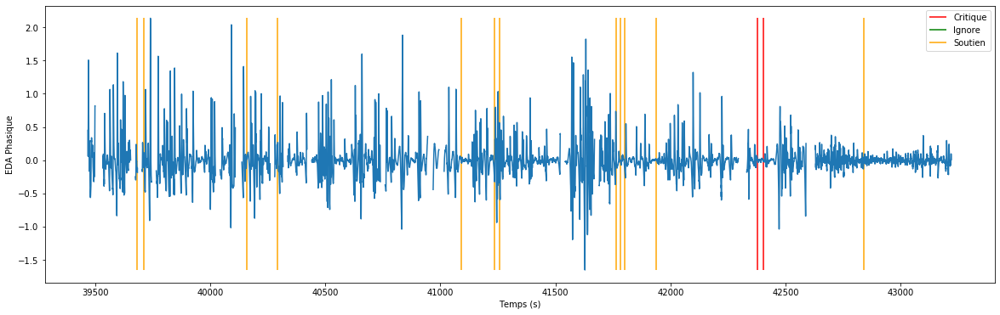

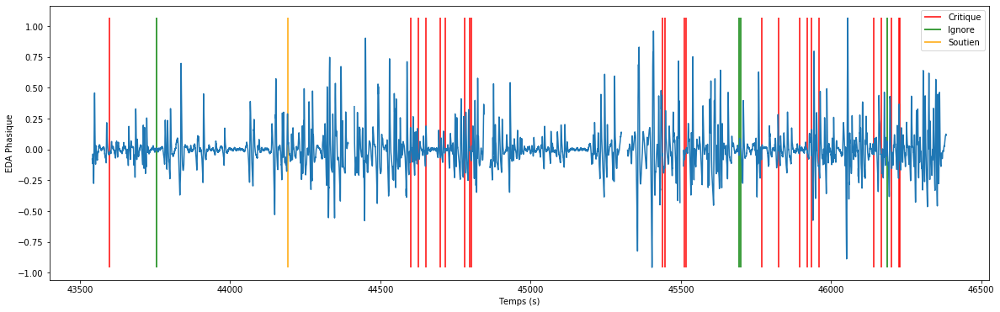

In [44]:
start, stop = 12000, -6000
for dyade in df_all.dyade.unique():
    selection_index = df_all.index[(df_all.dyade == dyade)][start:stop]
    df_dyade = df_all.loc[selection_index]
    df_dyade.index /= 100
    fig = plt.figure(figsize=(20,6))
    phasic = df_dyade["Étudiant - EDA phasic"]
    phasic.plot()
    event = df_dyade.Behavior_point_clean
    p1 = plt.vlines(event[event=='critique'].index, np.min(phasic), np.max(phasic), color='r')
    p2 = plt.vlines(event[event=='ignore'].index, np.min(phasic), np.max(phasic), color='g')
    p3 = plt.vlines(event[event=='soutien'].index, np.min(phasic), np.max(phasic), color='orange')
    #plt.ylim((-0.2, 0.3))
    plt.xlabel('Temps (s)')
    plt.ylabel('EDA Phasique')
    plt.legend([p1, p2, p3], ['Critique', 'Ignore', 'Soutien'], loc='upper right')
    plt.savefig('EDAPointState.png')

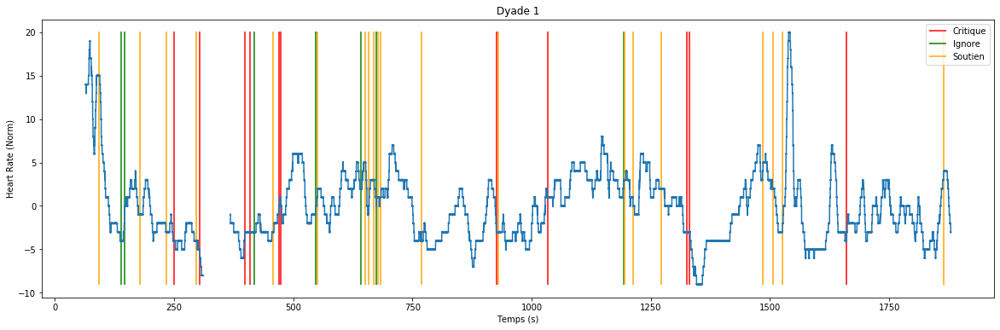

In [45]:
start, stop = 6000, -6000

for dyade in df_all.dyade.unique():
    df_dyade = df_all[df_all.dyade == dyade].iloc[start:stop]
    df_dyade.index /= 100
    df_dyade.index -= df_dyade.index[0]
    fig = plt.figure(figsize=(20,6))
    rate = df_dyade["Étudiant - Rate"]
    rate = rate.where(df_dyade['Étudiant - Rate Valid'])
    
    rate -= rate.mean()
    rate.plot()
    
    event = df_dyade.Behavior_point_clean
    p1 = plt.vlines(event[event=='critique'].index, np.min(rate), np.max(rate), color='r')
    p2 = plt.vlines(event[event=='ignore'].index, np.min(rate), np.max(rate), color='g')
    p3 = plt.vlines(event[event=='soutien'].index, np.min(rate), np.max(rate), color='orange')
    #plt.ylim((-0.2, 0.3))
    plt.xlabel('Temps (s)')
    plt.ylabel('Heart Rate (Norm)')
    plt.legend([p1, p2, p3], ['Critique', 'Ignore', 'Soutien'], loc='upper right')
    plt.title(f'Dyade {dyade}')
    break
    

# Tendance après event

In [46]:
from openpyxl.drawing.image import Image

from sklearn import linear_model

def fit_ransac_model(se, plot=False):
    se = se.fillna(method='ffill').fillna(method='bfill')
    se.index -= se.index[0]
    se.index /= 100
    if np.all(np.isnan(se)):
        return np.nan
    rs = linear_model.ransac.LinearRegression()
    rs.fit(np.reshape(se.index, (-1, 1)), se.values)
    if plot:
        plt.plot(se)
        plt.plot(se.index, se.index*rs.coef_[0]+ rs.intercept_)
    return np.squeeze(rs.coef_)

def write_to_excel(writer, critique_trends, ignore_trends, soutien_trends, fin_collaboration_trends, sheet_name):
    (pd.DataFrame({'dyade':critique_dyade, 'temps':critique_index, 'tendance':critique_trends})
        .to_excel(writer, sheet_name=sheet_name, index=False, startrow=2))

    (pd.DataFrame({'dyade':ignore_dyade, 'temps':ignore_index, 'tendance':ignore_trends})
        .to_excel(writer, sheet_name=sheet_name, index=False, startrow=2, startcol=4))

    (pd.DataFrame({'dyade':soutien_dyade, 'temps':soutien_index, 'tendance':soutien_trends})
        .to_excel(writer, sheet_name=sheet_name, index=False, startrow=2, startcol=8))
    
    (pd.DataFrame({'dyade':fin_collaboration_dyade, 'temps':fin_collaboration_index, 'tendance':fin_collaboration_trends})
        .to_excel(writer, sheet_name=sheet_name, index=False, startrow=2, startcol=12))

    writer.book[sheet_name]['A1'] = 'Critique'
    writer.book[sheet_name]['B1'] = 'T-test'
    writer.book[sheet_name]['B2'] = str(scipy.stats.ttest_1samp(critique_trends, 0, nan_policy='omit'))
    
    writer.book[sheet_name]['E1'] = 'Ignore'
    writer.book[sheet_name]['F1'] = 'T-test'
    writer.book[sheet_name]['F2'] = str(scipy.stats.ttest_1samp(ignore_trends, 0, nan_policy='omit'))
    
    writer.book[sheet_name]['I1'] = 'Soutien'
    writer.book[sheet_name]['J1'] = 'T-test'
    writer.book[sheet_name]['J2'] = str(scipy.stats.ttest_1samp(soutien_trends, 0, nan_policy='omit'))
    
    writer.book[sheet_name]['M1'] = 'Fin Collaboration'
    writer.book[sheet_name]['N1'] = 'T-test'
    writer.book[sheet_name]['N2'] = str(scipy.stats.ttest_1samp(fin_collaboration_trends, 0, nan_policy='omit'))

    writer.book[sheet_name]['P2'] = 'Taille du signal [s]'
    writer.book[sheet_name]['Q2'] = window_size /100
    writer.save()

    
    for i, (dyade, time, critique) in enumerate(zip(critique_dyade+ignore_dyade+soutien_dyade+fin_collaboration_dyade,
                                                    critique_index+ignore_index+soutien_index+fin_collaboration_index,
                                                    critique_windows+ignore_windows+soutien_windows+fin_collaboration_windows,)):
        fit_ransac_model(critique, True)
        plt.xlabel('temps [s]')
        plt.ylabel('HR [bpm]')
        plt.title('Dyade {} à {:.0f}s'.format(dyade, time))
        plt.savefig(f'img/{sheet_name}{i}.png')
        plt.clf()
        img = Image(f'img/{sheet_name}{i}.png')
        img.anchor = 'U{:d}'.format(i*15+2)
        writer.book[sheet_name].add_image(img)
        if i>10:
            break
    writer.save()

In [47]:
writer = pd.ExcelWriter('Point_event_responses.xlsx', engine='openpyxl')

In [48]:
sheet_name = "Events"

df_all.Behavior_clean
df_all.Behavior_point_clean

summary = df_all.groupby('dyade')["Behavior_point_clean"].value_counts().unstack().iloc[:, 1:]
summary.to_excel(writer, sheet_name=sheet_name, na_rep=0)


summary2 = (df_all.groupby('dyade')["Behavior_clean"].value_counts(normalize=True).unstack().iloc[:, 1:])
summary2.to_excel(writer, sheet_name=sheet_name, startcol=6, na_rep=0)


writer.save()

In [49]:
sheet_name = "Statistique Globale"

def amplitude_max(x):
    return x.max()-x.min()

summary = df_all.groupby('dyade')[["Étudiant - Rate",
                        "Étudiant - EDA phasic",
                        "Étudiant - EDA tonic",
                        'Directeur - Rate',
                        "Directeur - EDA phasic",
                        "Directeur - EDA tonic",]].agg(['mean', 'std', 'min', 'max', amplitude_max])

summary = summary.rename(columns={'Étudiant - Rate':'Étudiant - Heart Rate',
                       'Directeur - Rate':'Directeur - Heart Rate'})

summary.to_excel(writer, sheet_name=sheet_name)
writer.save()

## Tendance étudiant HR après l'evenement

In [50]:
window_size = 20 *100 # 20 sec

critique_index = df_all.index[(df_all.Behavior_point_clean == 'critique')]
ignore_index = df_all.index[(df_all.Behavior_point_clean == 'ignore')]
soutien_index = df_all.index[(df_all.Behavior_point_clean == 'soutien')]
fin_collaboration_index = df_all.index[(df_all.Behavior_clean == 'collaboration').astype(float).diff() == -1]


def get_windows(indexes):
    windows = []
    for index in indexes:
        time = df_all.loc[index, 'time']
        dyade = df_all.loc[index, 'dyade']
        rate = df_all.loc[index:index+window_size, ["Étudiant - Rate", 'Étudiant - Rate Valid']]
        rate = rate["Étudiant - Rate"].where(rate['Étudiant - Rate Valid'])
        if not np.all(np.isnan(rate)):
            windows.append((dyade, time, rate))
    return windows

critique_dyade, critique_index, critique_windows = zip(*get_windows(critique_index))
ignore_dyade, ignore_index, ignore_windows = zip(*get_windows(ignore_index))
soutien_dyade, soutien_index, soutien_windows = zip(*get_windows(soutien_index))
fin_collaboration_dyade, fin_collaboration_index, fin_collaboration_windows = zip(*get_windows(fin_collaboration_index))


critique_trends = np.stack(list(map(fit_ransac_model, critique_windows)))
ignore_trends = np.stack(list(map(fit_ransac_model, ignore_windows)))
soutien_trends = np.stack(list(map(fit_ransac_model, soutien_windows)))
fin_collaboration_trends = np.stack(list(map(fit_ransac_model, fin_collaboration_windows)))


write_to_excel(writer, critique_trends, ignore_trends, soutien_trends, fin_collaboration_trends, 'Étudiant HR')

<Figure size 432x288 with 0 Axes>

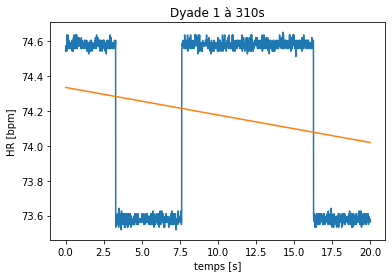

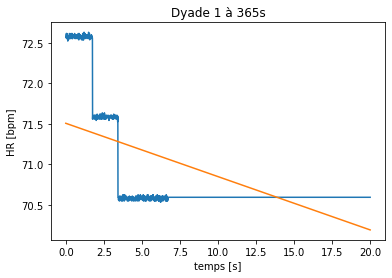

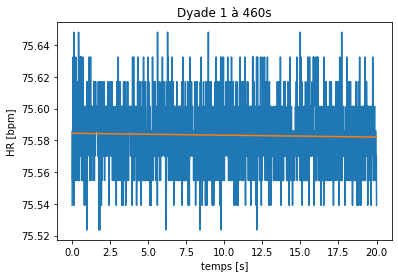

In [51]:
for i, (dyade, time, critique) in enumerate(zip(critique_dyade, critique_index, critique_windows)):
    fit_ransac_model(critique, True)
    plt.xlabel('temps [s]')
    plt.ylabel('HR [bpm]')
    plt.title('Dyade {} à {:.0f}s'.format(dyade, time))
    plt.savefig(f'img/img{i}.png')
    plt.show()
    if i>=2 : break

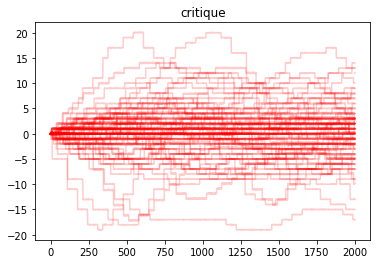

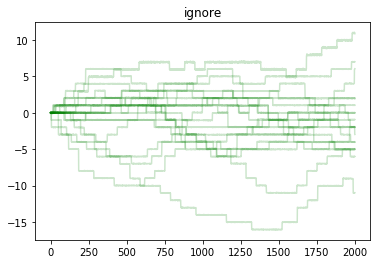

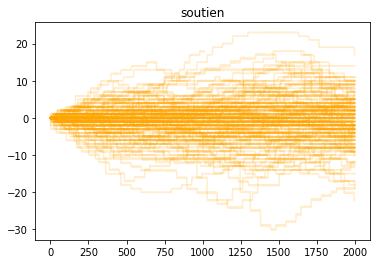

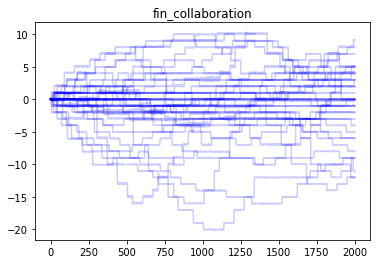

In [52]:
for window in critique_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='r', alpha=0.2)
    plt.title('critique')
plt.show()

for window in ignore_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='g', alpha=0.2)
    plt.title('ignore')
plt.show()
    
for window in soutien_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='orange', alpha=0.2)
    plt.title('soutien')
plt.show()

for window in fin_collaboration_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='blue', alpha=0.2)
    plt.title('fin_collaboration')
plt.show()

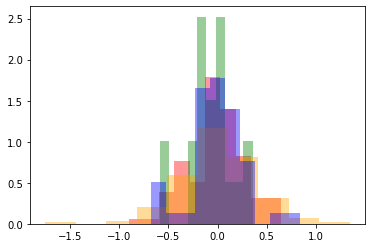

In [53]:
plt.hist(critique_trends, alpha=0.4, density=True, color='red')
plt.hist(ignore_trends, alpha=0.4, density=True, color='green')
plt.hist(soutien_trends, alpha=0.4, density=True, color='orange')
plt.hist(fin_collaboration_trends, alpha=0.4, density=True, color='blue')
plt.show()

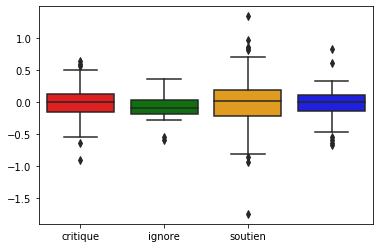

In [54]:
sns.boxplot(data=[critique_trends,
                ignore_trends,
                soutien_trends,
                fin_collaboration_trends], 
            palette=['r', 'g', 'orange', 'blue'],
           )
plt.xticks([0, 1, 2], ['critique', 'ignore', 'soutien', 'fin collaboration'])
plt.show()

In [55]:
critique_trends.mean()/critique_trends.std(), ignore_trends.mean()/ignore_trends.std(), soutien_trends.mean()/soutien_trends.std()

(-0.03322789289940662, -0.3722732510515615, -0.004818299221490839)

In [56]:
scipy.stats.ttest_1samp(critique_trends, 0), scipy.stats.ttest_1samp(ignore_trends, 0), scipy.stats.ttest_1samp(soutien_trends, 0)

(Ttest_1sampResult(statistic=-0.33227892899406625, pvalue=0.7403741411795808),
 Ttest_1sampResult(statistic=-1.6648565911122732, pvalue=0.1115301644319074),
 Ttest_1sampResult(statistic=-0.06410330184666001, pvalue=0.9489603106854609))

## Tendance directeur HR après l'evenement

In [57]:
window_size = 20 *100 # 20 sec

critique_index = df_all.index[(df_all.Behavior_point_clean == 'critique')]
ignore_index = df_all.index[(df_all.Behavior_point_clean == 'ignore')]
soutien_index = df_all.index[(df_all.Behavior_point_clean == 'soutien')]
fin_collaboration_index = df_all.index[(df_all.Behavior_clean == 'collaboration').astype(float).diff() == -1]

def get_windows(indexes):
    windows = []
    for index in indexes:
        time = df_all.loc[index, 'time']
        dyade = df_all.loc[index, 'dyade']
        rate = df_all.loc[index:index+window_size, ["Directeur - Rate", 'Directeur - Rate Valid']]
        rate = rate["Directeur - Rate"].where(rate['Directeur - Rate Valid'])
        if not np.all(np.isnan(rate)):
            windows.append((dyade, time, rate))
    return windows

critique_dyade, critique_index, critique_windows = zip(*get_windows(critique_index))
ignore_dyade, ignore_index, ignore_windows = zip(*get_windows(ignore_index))
soutien_dyade, soutien_index, soutien_windows = zip(*get_windows(soutien_index))
fin_collaboration_dyade, fin_collaboration_index, fin_collaboration_windows = zip(*get_windows(fin_collaboration_index))

critique_trends = np.stack(list(map(fit_ransac_model, critique_windows)))
ignore_trends = np.stack(list(map(fit_ransac_model, ignore_windows)))
soutien_trends = np.stack(list(map(fit_ransac_model, soutien_windows)))
fin_collaboration_trends = np.stack(list(map(fit_ransac_model, fin_collaboration_windows)))

write_to_excel(writer, critique_trends, ignore_trends, soutien_trends, fin_collaboration_trends, 'Directeur HR')

<Figure size 432x288 with 0 Axes>

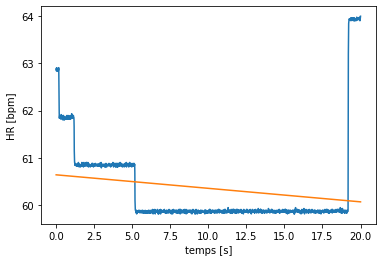

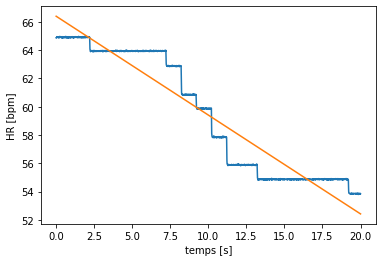

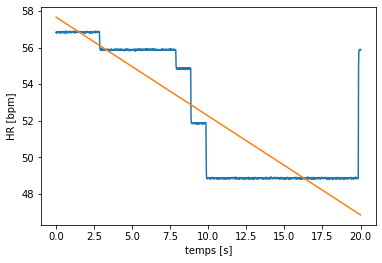

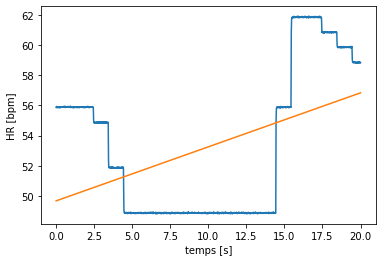

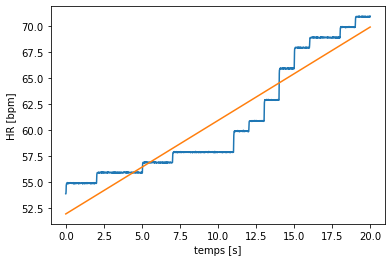

In [58]:
for critique in critique_windows[5:10]:
    fit_ransac_model(critique, True)
    plt.xlabel('temps [s]')
    plt.ylabel('HR [bpm]')
    plt.show()

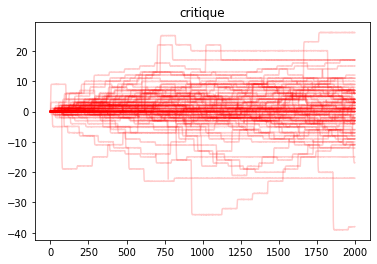

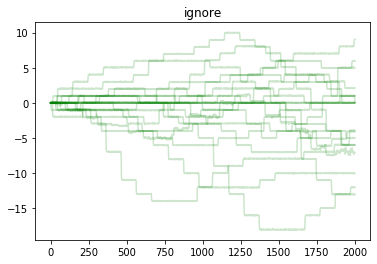

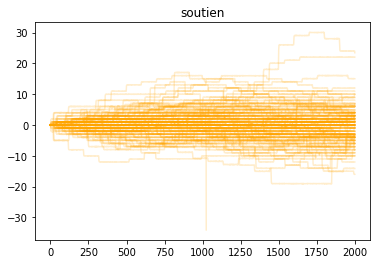

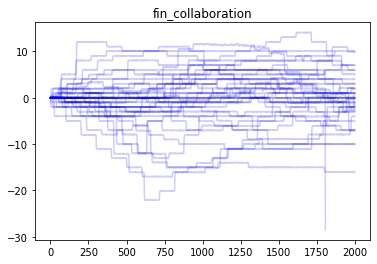

In [59]:
for window in critique_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='r', alpha=0.2)
    plt.title('critique')
plt.show()

for window in ignore_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='g', alpha=0.2)
    plt.title('ignore')
plt.show()
    
for window in soutien_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='orange', alpha=0.2)
    plt.title('soutien')
plt.show()

for window in fin_collaboration_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='blue', alpha=0.2)
    plt.title('fin_collaboration')
plt.show()

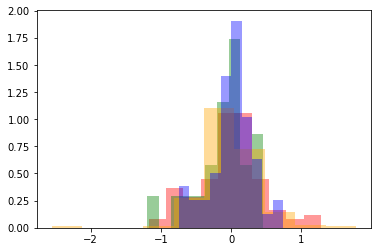

In [60]:
plt.hist(critique_trends, alpha=0.4, density=True, color='red')
plt.hist(ignore_trends, alpha=0.4, density=True, color='green')
plt.hist(soutien_trends, alpha=0.4, density=True, color='orange')
plt.hist(fin_collaboration_trends, alpha=0.4, density=True, color='blue')
plt.show()

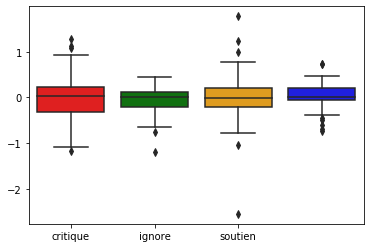

In [61]:
sns.boxplot(data=[critique_trends,
                ignore_trends,
                soutien_trends,
                fin_collaboration_trends], 
            palette=['r', 'g', 'orange', 'blue'],
           )
plt.xticks([0, 1, 2], ['critique', 'ignore', 'soutien', 'fin collaboration'])
plt.show()

In [62]:
critique_trends.mean()/critique_trends.std(), ignore_trends.mean()/ignore_trends.std(), soutien_trends.mean()/soutien_trends.std()

(-0.0218061961954454, -0.27853271739993585, -0.042125971396571725)

In [63]:
scipy.stats.ttest_1samp(critique_trends, 0), scipy.stats.ttest_1samp(ignore_trends, 0), scipy.stats.ttest_1samp(soutien_trends, 0)

(Ttest_1sampResult(statistic=-0.218061961954454, pvalue=0.827825200085898),
 Ttest_1sampResult(statistic=-1.24563618012799, pvalue=0.22729388412760215),
 Ttest_1sampResult(statistic=-0.5604495976450924, pvalue=0.5758815094037346))

## Tendance étudiant Eda après l'evenement

In [64]:
window_size = 8 *100 # 8 sec

critique_index = df_all.index[(df_all.Behavior_point_clean == 'critique')]
ignore_index = df_all.index[(df_all.Behavior_point_clean == 'ignore')]
soutien_index = df_all.index[(df_all.Behavior_point_clean == 'soutien')]
fin_collaboration_index = df_all.index[(df_all.Behavior_clean == 'collaboration').astype(float).diff() == -1]

def get_windows(indexes):
    windows = []
    for index in indexes:
        time = df_all.loc[index, 'time']
        dyade = df_all.loc[index, 'dyade']
        rate = df_all.loc[index:index+window_size, "Étudiant - EDA phasic"]
        windows.append((dyade, time, rate))
    return windows

critique_dyade, critique_index, critique_windows = zip(*get_windows(critique_index))
ignore_dyade, ignore_index, ignore_windows = zip(*get_windows(ignore_index))
soutien_dyade, soutien_index, soutien_windows = zip(*get_windows(soutien_index))
fin_collaboration_dyade, fin_collaboration_index, fin_collaboration_windows = zip(*get_windows(fin_collaboration_index))


critique_trends = np.stack(list(map(fit_ransac_model, critique_windows)))
ignore_trends = np.stack(list(map(fit_ransac_model, ignore_windows)))
soutien_trends = np.stack(list(map(fit_ransac_model, soutien_windows)))
fin_collaboration_trends = np.stack(list(map(fit_ransac_model, fin_collaboration_windows)))

write_to_excel(writer, critique_trends, ignore_trends, soutien_trends, fin_collaboration_trends, 'Étudiant EDA')

<Figure size 432x288 with 0 Axes>

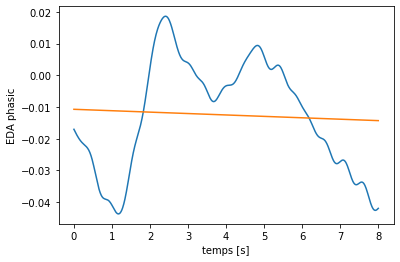

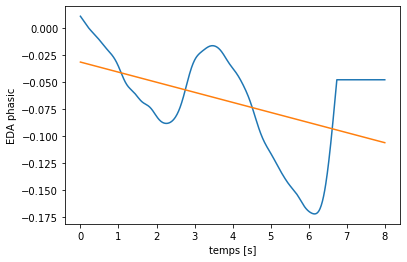

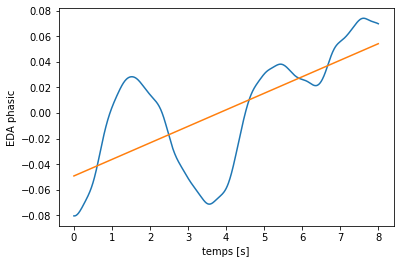

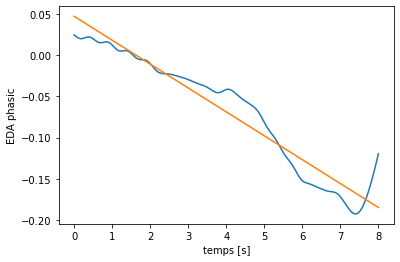

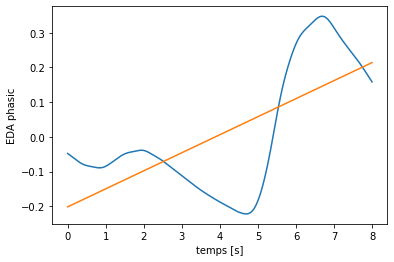

In [65]:
for critique in critique_windows[:5]:
    fit_ransac_model(critique, plot=True)
    plt.xlabel('temps [s]')
    plt.ylabel('EDA phasic')
    plt.show()

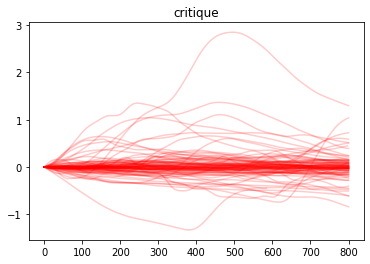

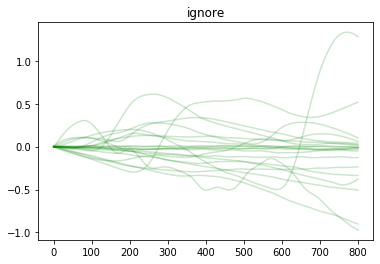

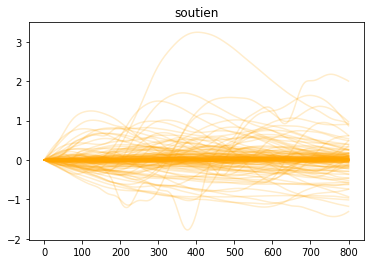

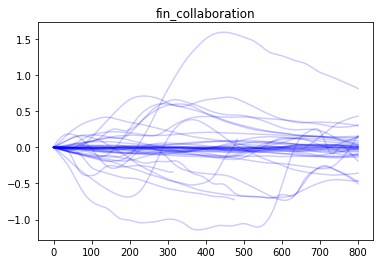

In [66]:
for window in critique_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='r', alpha=0.2)
    plt.title('critique')
plt.show()

for window in ignore_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='g', alpha=0.2)
    plt.title('ignore')
plt.show()
    
for window in soutien_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='orange', alpha=0.2)
    plt.title('soutien')
plt.show()

for window in fin_collaboration_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='blue', alpha=0.2)
    plt.title('fin_collaboration')
plt.show()

C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


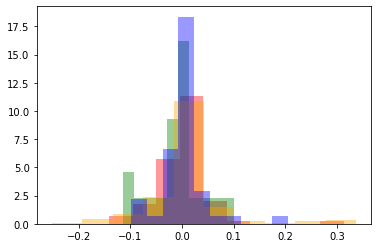

In [67]:
plt.hist(critique_trends, alpha=0.4, density=True, color='red')
plt.hist(ignore_trends, alpha=0.4, density=True, color='green')
plt.hist(soutien_trends, alpha=0.4, density=True, color='orange')
plt.hist(fin_collaboration_trends, alpha=0.4, density=True, color='blue')
plt.show()

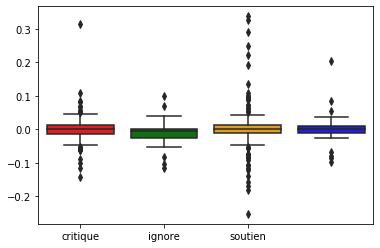

In [68]:
sns.boxplot(data=[critique_trends,
                ignore_trends,
                soutien_trends,
                fin_collaboration_trends], 
            palette=['r', 'g', 'orange', 'blue'],
           )
plt.xticks([0, 1, 2], ['critique', 'ignore', 'soutien', 'fin collaboration'])
plt.show()

In [69]:
critique_trends.mean()/critique_trends.std(), ignore_trends.mean()/ignore_trends.std(), soutien_trends.mean()/soutien_trends.std()

(nan, nan, nan)

In [70]:
scipy.stats.ttest_1samp(critique_trends, 0), scipy.stats.ttest_1samp(ignore_trends, 0), scipy.stats.ttest_1samp(soutien_trends, 0)

C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\scipy\stats\_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


(Ttest_1sampResult(statistic=nan, pvalue=nan),
 Ttest_1sampResult(statistic=nan, pvalue=nan),
 Ttest_1sampResult(statistic=nan, pvalue=nan))

## Tendance Directeur Eda après l'evenement

In [71]:
window_size = 8 *100 # 8 sec

critique_index = df_all.index[(df_all.Behavior_point_clean == 'critique')]
ignore_index = df_all.index[(df_all.Behavior_point_clean == 'ignore')]
soutien_index = df_all.index[(df_all.Behavior_point_clean == 'soutien')]
fin_collaboration_index = df_all.index[(df_all.Behavior_clean == 'collaboration').astype(float).diff() == -1]

def get_windows(indexes):
    windows = []
    for index in indexes:
        time = df_all.loc[index, 'time']
        dyade = df_all.loc[index, 'dyade']
        rate = df_all.loc[index:index+window_size, "Directeur - EDA phasic"]
        windows.append((dyade, time, rate))
    return windows

critique_dyade, critique_index, critique_windows = zip(*get_windows(critique_index))
ignore_dyade, ignore_index, ignore_windows = zip(*get_windows(ignore_index))
soutien_dyade, soutien_index, soutien_windows = zip(*get_windows(soutien_index))
fin_collaboration_dyade, fin_collaboration_index, fin_collaboration_windows = zip(*get_windows(fin_collaboration_index))


critique_trends = np.stack(list(map(fit_ransac_model, critique_windows)))
ignore_trends = np.stack(list(map(fit_ransac_model, ignore_windows)))
soutien_trends = np.stack(list(map(fit_ransac_model, soutien_windows)))
fin_collaboration_trends = np.stack(list(map(fit_ransac_model, fin_collaboration_windows)))

write_to_excel(writer, critique_trends, ignore_trends, soutien_trends, fin_collaboration_trends, 'Directeur EDA')

<Figure size 432x288 with 0 Axes>

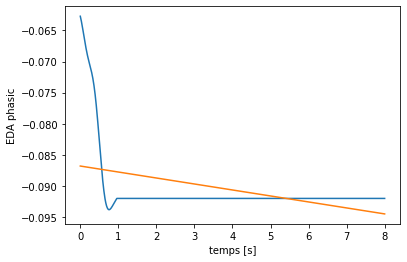

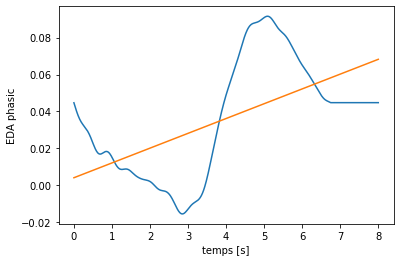

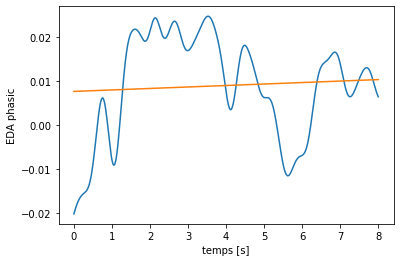

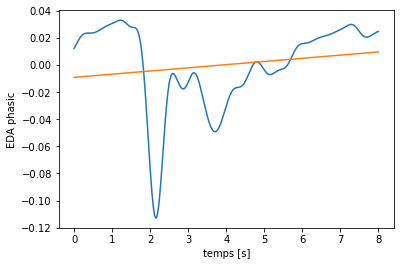

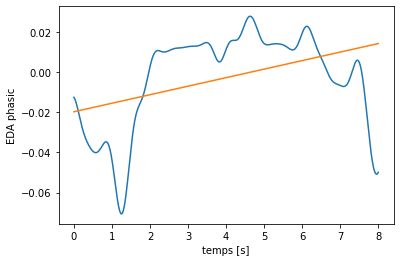

In [72]:
for critique in critique_windows[:5]:
    fit_ransac_model(critique, plot=True)
    plt.xlabel('temps [s]')
    plt.ylabel('EDA phasic')
    plt.show()

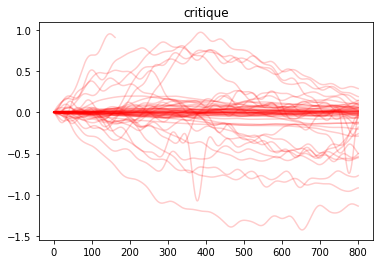

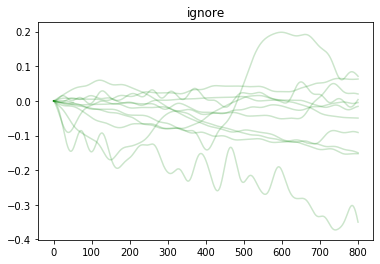

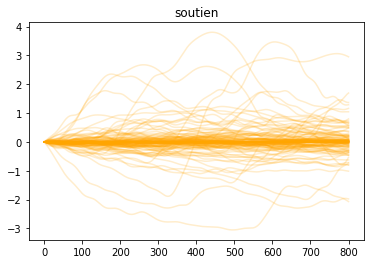

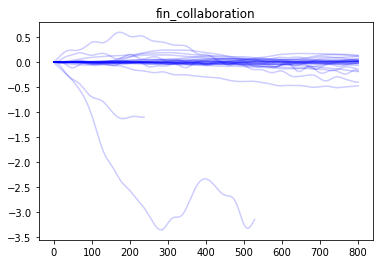

In [73]:
for window in critique_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='r', alpha=0.2)
    plt.title('critique')
plt.show()

for window in ignore_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='g', alpha=0.2)
    plt.title('ignore')
plt.show()
    
for window in soutien_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='orange', alpha=0.2)
    plt.title('soutien')
plt.show()

for window in fin_collaboration_windows:
    window -= window.iloc[0]
    plt.plot(window.values, color='blue', alpha=0.2)
    plt.title('fin_collaboration')
plt.show()

C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


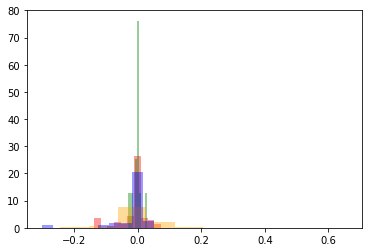

In [74]:
plt.hist(critique_trends, alpha=0.4, density=True, color='red')
plt.hist(ignore_trends, alpha=0.4, density=True, color='green')
plt.hist(soutien_trends, alpha=0.4, density=True, color='orange')
plt.hist(fin_collaboration_trends, alpha=0.4, density=True, color='blue')
plt.show()

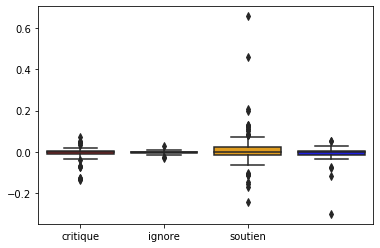

In [75]:
sns.boxplot(data=[critique_trends,
                ignore_trends,
                soutien_trends,
                fin_collaboration_trends], 
            palette=['r', 'g', 'orange', 'blue'],
           )
plt.xticks([0, 1, 2], ['critique', 'ignore', 'soutien', 'fin collaboration'])
plt.show()

In [76]:
critique_trends.mean()/critique_trends.std(), ignore_trends.mean()/ignore_trends.std(), soutien_trends.mean()/soutien_trends.std()

(nan, nan, nan)

In [77]:
scipy.stats.ttest_1samp(critique_trends, 0), scipy.stats.ttest_1samp(ignore_trends, 0), scipy.stats.ttest_1samp(soutien_trends, 0)

C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\alfoc.ULAVAL\AppData\Local\Continuum\Miniconda3\envs\data-science\lib\site-packages\scipy\stats\_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


(Ttest_1sampResult(statistic=nan, pvalue=nan),
 Ttest_1sampResult(statistic=nan, pvalue=nan),
 Ttest_1sampResult(statistic=nan, pvalue=nan))

## Behaviour State event

In [78]:
bio_cols = ['Étudiant - Rate', 'Directeur - Rate', 'Étudiant - EDA', 'Directeur - EDA', 'Étudiant - EDA phasic', 'Directeur - EDA phasic', 'Étudiant - EDA tonic', 'Directeur - EDA tonic']

In [79]:
with pd.option_context('display.max_columns', 999):
    display(df_all.groupby('Behavior_clean').agg(['mean', 'std']).loc[['ambigu', 'collaboration', 'retrait'], bio_cols])

Étudiant - Rate            Directeur - Rate             \
                          mean        std             mean        std   
Behavior_clean                                                          
ambigu               81.022934  11.200595        75.472214  20.299988   
collaboration        77.604553  12.486477        72.217621  13.124438   
retrait              80.787445   2.318475        68.925598  17.748236   

               Étudiant - EDA           Directeur - EDA            \
                         mean       std            mean       std   
Behavior_clean                                                      
ambigu              10.791998  8.617707       17.110456  6.836471   
collaboration        9.464684  6.485020       17.701324  7.680161   
retrait              8.495509  6.202878        5.212093  4.419667   

               Étudiant - EDA phasic           Directeur - EDA phasic  \
                                mean       std                   mean   
Behavior_clean                                                          
ambigu                      0.001342  0.234216              -0.000413   
collaboration               0.000401  0.253554               0.000889   
retrait                    -0.003024  0.157930              -0.001224   

                         Étudiant - EDA tonic           Directeur - EDA tonic  \
                     std                 mean       std                  mean   
Behavior_clean                                                                  
ambigu          0.160609            10.090645  8.154436             18.372984   
collaboration   0.283037            10.440799  5.835997             19.128374   
retrait         0.062747             7.678103  4.956716              5.508863   

                          
                     std  
Behavior_clean            
ambigu          6.934877  
collaboration   7.250427  
retrait         4.289898

In [80]:
!jupyter  nbconvert --to=html --template hideinput --output="index.html"  "1-1 data exploration.ipynb" 

[NbConvertApp] Converting notebook 1-1 data exploration.ipynb to html
[NbConvertApp] Writing 11292792 bytes to index.html
